In [ ]:
!apt-get -y install libopenjp2-7-dev libopenjp2-tools openslide-tools | tail --line 1
!pip install tiatoolbox seaborn | tail -n 1
ON_GPU=False
print('Installation is done.')
!pip install torch==1.9.1+cu102 torchvision==0.10.1+cu102 -f https://download.pytorch.org/whl/cu102/torch_stable.html --user
ON_GPU = True 
!pip install seaborn
!pip install Pillow==9.0.0
!pip install validators matplotlib
!pip install torch-summary
!pip uninstall matplotlib
!pip install matplotlib==3.1.3
!pip install captum
!pip install segmentation_models_pytorch
!pip install torchmetrics

Processing triggers for man-db (2.8.3-2ubuntu0.1) ...


Installation is done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/cu102/torch_stable.html
     |████████████████████████████████| 831.4 MB 5.8 kB/s 
     |████████████████████████████████| 22.1 MB 1.2 MB/s 
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.13.1 requires torch==1.12.1, but you have torch 1.9.1+cu102 which is incompatible.
torchaudio 0.12.1+cu113 requires torch==1.12.1, but you have torch 1.9.1+cu102 which is incompatible.
tiatoolbox 1.2.1 requires torch>=1.11.0, but you have torch 1.9.1+cu102 which is incompatible.
tiatoolbox 1.2.1 requires torchvision>=0.12.0, but you have torchvision 0.10.1+cu102 which is incompatib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for validators: filename=validators-0.20.0-py3-none-any.whl size=19582 sha256=a06ee31c7d40e023157f963cc45c75f46e1485e0ae6f27b7db97891ad1492b71
  Stored in directory: /root/.cache/pip/wheels/5f/55/ab/36a76989f7f88d9ca7b1f68da6d94252bb6a8d6ad4f18e04e9
Successfully built validators
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Found existing installation: matplotlib 3.5.3
Uninstalling matplotlib-3.5.3:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/matplotlib-3.5.3-py3.7-nspkg.pth
    /usr/local/lib/python3.7/dist-packages/matplotlib-3.5.3.dist-info/*
    /usr/local/lib/python3.7/dist-packages/matplotlib/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axes_grid/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axes_grid1/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axisartist/*
   

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.4 MB 8.2 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 97 kB 4.5 MB/s 
     |████████████████████████████████| 58 kB 5.8 MB/s 
     |████████████████████████████████| 376 kB 53.2 MB/s 
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16446 sha256=8e2ad05071fed33b561d28f459c32d468676300fd74de5179dee02e24c3a9e59
  Stored in directory: /root/.cache/pip/wheels/0e/cc/b2/49e74588263573ff778da58cc99b9c6349b496636a7e165be6
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60965 sha256=257ebec26d8a33f6e5a03b4296d44cd95c87d48ce5c1ddec57f6fa258bb8813b
  Stored in directory: /root/.cache/pip/wheels/ed/27/e8/9543d42de2740d3544db96aefef63bda3f2c1761b3334f4873
Successfully 

In [ ]:
import tables
import cv2
from PIL import Image
from random import randint 
import torchvision
import tables as pt
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.transforms.functional as F
import torch.nn.functional as P
import random
import albumentations as A
import sys
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt 
from skimage import segmentation

import numpy as np
from tiatoolbox.tools import patchextraction
import time
import os
import copy
from sklearn.metrics import cohen_kappa_score,precision_score, recall_score, f1_score, multilabel_confusion_matrix, confusion_matrix
import pandas as pd
from sklearn.model_selection import train_test_split
import seaborn as sns 
import warnings
warnings.filterwarnings('ignore')
import pickle
import PIL 
from torchsummary import summary
from captum.attr import IntegratedGradients
from captum.attr import GradientShap
from tiatoolbox.models.engine.semantic_segmentor import (
    IOSegmentorConfig,
    SemanticSegmentor,
)
import math
from tqdm import tqdm
from torchmetrics import JaccardIndex
from captum.attr import Occlusion
from captum.attr import NoiseTunnel
from captum.attr import visualization as viz
from matplotlib.colors import LinearSegmentedColormap
from google.colab.patches import cv2_imshow
from skimage.morphology import reconstruction
from tiatoolbox.tools.tissuemask import MorphologicalMasker
plt.style.use('seaborn')
import segmentation_models_pytorch as smp
from segmentation_models_pytorch.encoders import get_preprocessing_fn
from torchvision.transforms.transforms import ToPILImage
from albumentations.pytorch.transforms import ToTensorV2
from skimage import segmentation

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
img_dtype = tables.UInt8Atom()  # dtype in which the images will be saved, this indicates that images will be saved as unsigned int 8 bit, i.e., [0,255]
filenameAtom = tables.StringAtom(itemsize=255) #create an atom to store the filename of the image, just incase we need it later, 
training_directory = '/content/gdrive/MyDrive/1.training/1.training/'
validation_directory = '/content/gdrive/MyDrive/2.validation/2.validation/'
testing_directory = '/content/gdrive/MyDrive/3.testing/3.testing/'


In [ ]:
#Match the ground truth to the training image
X_image_strings = list()
training_y_labels = list()

for image_string in os.listdir(training_directory):
  X_image_strings.append(os.path.join(training_directory,image_string))
  new_string = image_string[-13:-4].strip()
  new_label= [int(new_string[-8]),int(new_string[-5]),int(new_string[-2])]
  training_y_labels.append(np.array(new_label))

In [ ]:
non_single_class_images = list()
non_single_class_images_y = list()
only_tumour_i = list()
only_stroma_i = list()
only_normal_i = list()
listing_dir = os.listdir(training_directory)
for i in range(len(listing_dir)):
   io=cv2.cvtColor(cv2.imread(training_directory+listing_dir[i]),cv2.COLOR_BGR2RGB)
   interp_method=PIL.Image.BICUBIC
   io = cv2.resize(io,(0,0),fx=1,fy=1, interpolation=interp_method) #resize it as specified above
   io = cv2.resize(io,(224,224))

   if all(training_y_labels[i] == [1,0,0]):
      only_tumour_i.append(io)
   elif all(training_y_labels[i] == [0,1,0]):
      only_stroma_i.append(io)
   elif all(training_y_labels[i] == [0,0,1]):
      only_normal_i.append(io)
   else:
     non_single_class_images.append(io)
     non_single_class_images_y.append(training_y_labels[i])



In [ ]:
def create_background_mask(image):
  background_map =  np.zeros((224,224),dtype=np.uint8)
  kernel = np.ones((3,3),np.uint8)
  for i in range(224):
    for j in range(224):
      if all(pixel>= 224 for pixel in image[i][j]):
        background_map[i][j] = 255
      else:
        background_map[i][j] = 0
  closing = cv2.morphologyEx(background_map, cv2.MORPH_CLOSE, kernel)
  final = cv2.erode(closing,kernel,iterations = 1)

  return final 

In [ ]:
def make_mask_tumour(image):
  bg_mask = create_background_mask(image)
  image_mask = np.zeros((224,224,3),dtype=np.uint8)
  for i in range(len(bg_mask)):
    for j in range(len(bg_mask[i])):
      if (bg_mask[i][j]==255).all():
        image_mask[i][j] = [255,255,255]
      else:
        image_mask[i][j] = [0,64,128]
  return image_mask

In [ ]:
def make_mask_other(image):
  
  bg_mask = create_background_mask(image)
  image_mask = np.zeros((224,224,3),dtype=np.uint8)
  
  for i in range(len(bg_mask)):
    for j in range(len(bg_mask[i])):
      if (bg_mask[i][j]==255).all():
        image_mask[i][j] = [255,255,255]
      else:
        image_mask[i][j] = [193,154,107]
  return image_mask

In [ ]:
def create_images_for_item(all_data,class_name):
  Masks = list()
  if class_name == 'tumour':
    for item in all_data:
      Masks.append(make_mask_tumour(item))
  elif class_name == 'stroma':
    count = 0
    for item in all_data:
      count+=1
      print(count)
      Masks.append(make_mask_other(item))
  elif class_name == 'normal':
    count = 0
    for item in all_data:
      count+=1
      print(count)
      Masks.append(make_mask_other(item))
  return Masks

In [ ]:
tumour_masks = create_images_for_item(only_tumour_i,'tumour')

In [ ]:
stroma_masks = create_images_for_item(only_stroma_i,'stroma')

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80


KeyboardInterrupt: ignored

In [ ]:
normal_masks = create_images_for_item(only_normal_i,'normal')

In [ ]:
other_masks = stroma_masks.extend(normal_masks)

In [ ]:
tumour_masks = list()
stroma_masks = list()
normal_masks = list()
for i in range(len(only_tumour_i)):
  number = str(i)
  print(i)
  tumour_masks.append(np.load('/content/gdrive/MyDrive/Whole_masks/masks/tumour/'+number+'.npy',))

for i in range(len(only_stroma_i)):
  number = str(i)
  stroma_masks.append(np.load('/content/gdrive/MyDrive/Whole_masks/masks/stroma/'+number+'.npy',))


for i in range(len(only_normal_i)):
  number = str(i)
  normal_masks.append(np.load('/content/gdrive/MyDrive/Whole_masks/masks/normal/'+number+'.npy',))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [ ]:
stroma_masks = list()
normal_masks = list()
for i in range(len(only_stroma_i)):
  number = str(i)
  stroma_masks.append(np.load('/content/gdrive/MyDrive/Whole_masks/masks/stroma/'+number+'.npy',))


for i in range(len(only_normal_i)):
  number = str(i)
  normal_masks.append(np.load('/content/gdrive/MyDrive/Whole_masks/masks/normal/'+number+'.npy',))

In [ ]:
stroma_masks.extend(normal_masks)

In [ ]:
def create_other_masks(masks):
  new_masks = list()
  for mask in masks:
    this_mask = mask.copy()
    np.putmask(this_mask, this_mask == [64,128,0],[193,154,107])
    np.putmask(this_mask, this_mask == [243,152,0], [193,154,107])
    new_masks.append(this_mask)
  return new_masks 

In [ ]:
GAMMA = 56

In [ ]:
other_masks = create_other_masks(stroma_masks)

In [ ]:
only_stroma_i.extend(only_normal_i)

In [ ]:
len(only_stroma_i)

3512

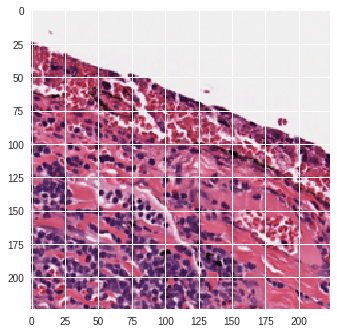

In [ ]:
plt.imshow(only_stroma_i[3])

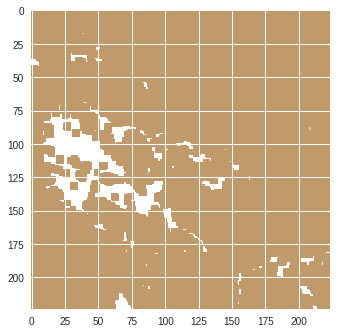

In [ ]:
plt.imshow(other_masks[0])

# Patch Creation

In [ ]:
def create_a_tiled_image(image,mask):
  total_image_grid = list()
  row_image = list()
  total_mask_grid = list()
  row_mask = list()


  count_image = 0
  count_mask = 0
  sliding_window_patch_extractor = patchextraction.SlidingWindowPatchExtractor(
          input_img=image, # input image path, numpy array, or WSI object
          patch_size=(GAMMA, GAMMA),
          input_mask = None,
          # also supports "point" and "slidingwindow"
          # size of the patch to extract around the centroids from centroids_list
      )
  
  sliding_window_patch_extractor_mask = patchextraction.SlidingWindowPatchExtractor(
          input_img=mask, # input image path, numpy array, or WSI object
          patch_size=(GAMMA, GAMMA),
          input_mask = None,
          # also supports "point" and "slidingwindow"
          # size of the patch to extract around the centroids from centroids_list
          # stride of extracting patches, default is equal to patch_size
      )
  
  for patch in sliding_window_patch_extractor:
    row_image.append(patch)
    if len(row_image) == 224/GAMMA:
      total_image_grid.append(row_image)
      row_image = list()

  for patch in sliding_window_patch_extractor_mask:
    row_mask.append(patch)
    if len(row_mask) == 224/GAMMA:
      total_mask_grid.append(row_mask)
      row_mask = list()
  return total_image_grid, total_mask_grid



In [ ]:
tumour_image_grids = list()
tumour_mask_grids = list()

other_image_grids = list()
other_mask_grids = list()


for i in range(len(only_tumour_i)):
  image_grid, mask_grid = create_a_tiled_image(only_tumour_i[i], tumour_masks[i])

  tumour_image_grids.append(image_grid)
  tumour_mask_grids.append(mask_grid)

for i in range(len(only_stroma_i)):
  image_grid, mask_grid = create_a_tiled_image(only_stroma_i[i], other_masks[i])
  other_image_grids.append(image_grid)
  other_mask_grids.append(mask_grid)




([], <a list of 0 Text yticklabel objects>)

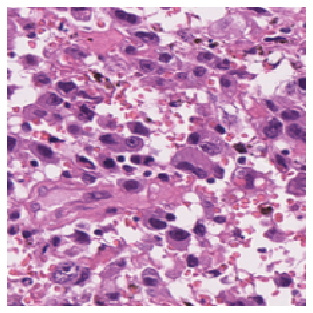

In [ ]:
plt.imshow(only_tumour_i[0])
plt.grid(False)
plt.grid(None)
plt.xticks([])
plt.yticks([])

In [ ]:
c = list(zip(other_image_grids, other_mask_grids))

random.shuffle(c)

other_image_grids, other_mask_grids = zip(*c)



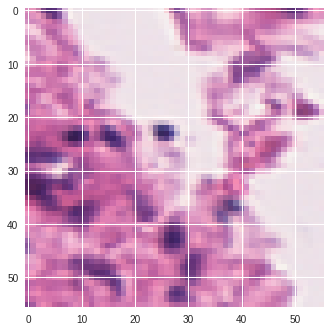

In [ ]:
plt.imshow(other_image_grids[0][2][3])

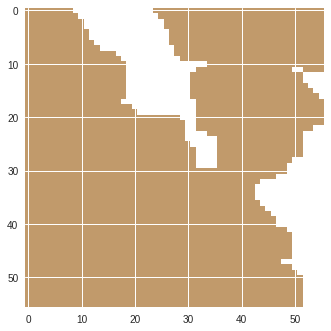

In [ ]:
plt.imshow(other_mask_grids[0][2][3])

In [ ]:
def create_random_double_map(class_one_value,class_two_value):
  map = []
  for y in range(int(224/GAMMA)):
      row = []
      for x in range(int(224/GAMMA)):
          value = random.randint(1, 2)
          if value==1:
            row.append(class_one_value)
          elif value ==2:
            row.append(class_two_value)
      map.append(row)
  return map 

In [ ]:
def create_double_class_image(class_one_grid, class_two_grid, class_one_mask_grid, class_two_mask_grid, class_one_value,class_two_value):
  prob_grid = create_random_double_map(class_one_value, class_two_value)
  image = np.zeros((224,224,3),dtype=np.uint8)
  mask = np.zeros((224,224,3),dtype=np.uint8)

  if class_one_value == 1:
    class_one_string = 'tumour'
  elif class_one_value == 2:
    class_one_string = 'other'
  if class_two_value == 1:
    class_two_string = 'tumour'
  elif class_two_value == 2:
    class_two_string = 'other'


  for i in range(1,5):
    for j in range(1,5):
      if prob_grid[i-1][j-1] == class_one_value:
        image[(i-1)*GAMMA : i*GAMMA, (j-1)*GAMMA : j*GAMMA, :] = class_one_grid[i-1][j-1]
        mask[(i-1)*GAMMA : i*GAMMA, (j-1)*GAMMA : j*GAMMA, :] = class_one_mask_grid[i-1][j-1]

      elif prob_grid[i-1][j-1] == class_two_value:
        image[(i-1)*GAMMA:i*GAMMA,(j-1)*GAMMA:j*GAMMA,:] = class_two_grid[i-1][j-1]
        mask[(i-1)*GAMMA : i*GAMMA, (j-1)*GAMMA : j*GAMMA, :] = class_two_mask_grid[i-1][j-1]

  spare_images = {
      'tumour': list(),
      'other': list(),
  }
  spare_image_masks = {
      'tumour':list(),
      'other':list(),
  }

  for i in range(0,4):
    for j in range(0,4):
      if prob_grid[i][j] == class_one_value:

        spare_images[class_two_string].append(class_two_grid[i][j])
        spare_image_masks[class_two_string].append(class_two_mask_grid[i][j])

      elif prob_grid[i][j] == class_two_value:
        spare_images[class_one_string].append(class_one_grid[i][j])
        spare_image_masks[class_one_string].append(class_one_mask_grid[i][j])


  return image, mask, prob_grid, spare_images, spare_image_masks


In [ ]:
len(only_tumour_i)

1181

In [ ]:
tumour_other_images = list()
tumour_other_masks = list()
spare_image_tumour_other = list()
spare_image_tumour_other_mask = list()
prob_grids_tumour_other = list()

for i in range(0,1181):
  image, mask, grid, spare_images_dict, spare_mask_dict = create_double_class_image(tumour_image_grids[i],other_image_grids[i], tumour_mask_grids[i], other_mask_grids[i], 1 , 2)
  tumour_other_images.append(image)
  tumour_other_masks.append(mask)
  prob_grids_tumour_other.append(grid)
  spare_image_tumour_other.append(spare_images_dict)
  spare_image_tumour_other_mask.append(spare_mask_dict)


In [ ]:
np.array(prob_grids_tumour_other[0])

array([[1, 1, 1, 2],
       [1, 1, 1, 2],
       [2, 1, 2, 1],
       [2, 2, 2, 2]])

In [ ]:
np.array(prob_grids_tumour_other[1])

array([[1, 2, 1, 2],
       [1, 1, 1, 2],
       [2, 1, 1, 1],
       [1, 1, 2, 2]])

([], <a list of 0 Text yticklabel objects>)

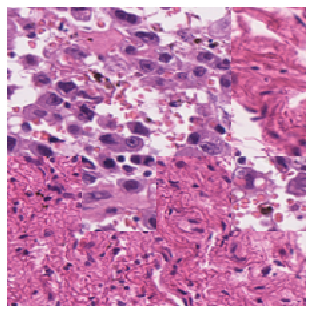

In [ ]:
plt.imshow(tumour_other_images[0])
plt.grid(False)
plt.grid(None)
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

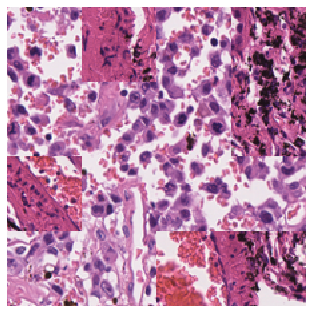

In [ ]:
plt.imshow(tumour_other_images[1])
plt.grid(False)
plt.grid(None)
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

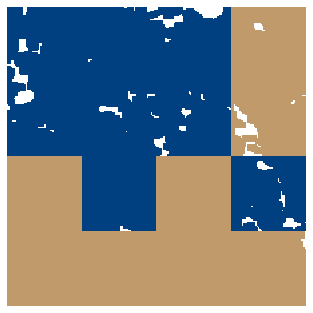

In [ ]:
plt.imshow(tumour_other_masks[0])
plt.grid(False)

plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

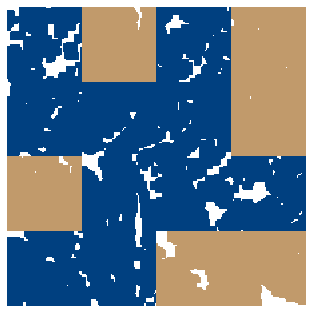

In [ ]:
plt.imshow(tumour_other_masks[1])
plt.grid(False)
plt.grid(None)
plt.xticks([])
plt.yticks([])

In [ ]:
len(tumour_other_images)

1181

In [ ]:
# Append spares

spare_tumour_patches = list()
spare_tumour_mask_patches = list()

spare_other_patches = list()
spare_other_mask_patches = list()




In [ ]:
def spare_image_collector(image_dict_list, mask_dict_list):
  for i in range(len(image_dict_list)):
    spare_tumour_patches.extend(image_dict_list[i]['tumour'])
    spare_tumour_mask_patches.extend(mask_dict_list[i]['tumour'])

    spare_other_patches.extend(image_dict_list[i]['other'])
    spare_other_mask_patches.extend(mask_dict_list[i]['other'])



In [ ]:
spare_image_collector(spare_image_tumour_other,spare_image_tumour_other_mask)


In [ ]:
len(spare_tumour_patches)

9359

In [ ]:
len(spare_other_patches)

9537

In [ ]:
def create_random_spare_double(patch_stats,number_of_images,class_one_value, class_two_value):
  tumour_used = patch_stats[0]
  other_used = patch_stats[1]
  images = list()
  masks = list()

  for i in range(number_of_images):
    prob_grid = create_random_double_map(class_one_value,class_two_value)
    image = np.zeros((224,224,3),dtype=np.uint8)
    mask = np.zeros((224,224,3),dtype=np.uint8)
    

    for i in range(1,5):
      for j in range(1,5):
        if prob_grid[i-1][j-1] == 1:
          image[(i-1)*GAMMA : i*GAMMA, (j-1)*GAMMA : j*GAMMA, :] = spare_tumour_patches[tumour_used]
          mask[(i-1)*GAMMA : i*GAMMA, (j-1)*GAMMA : j*GAMMA, :] = spare_tumour_mask_patches[tumour_used]
          tumour_used +=1 
        elif prob_grid[i-1][j-1] == 2:
          image[(i-1)*GAMMA:i*GAMMA,(j-1)*GAMMA:j*GAMMA,:] = spare_other_patches[other_used]
          mask[(i-1)*GAMMA : i*GAMMA, (j-1)*GAMMA : j*GAMMA, :] = spare_other_mask_patches[other_used]
          other_used+=1

    images.append(image)
    masks.append(mask)


  image_stats = [tumour_used,other_used]

  return images,masks, image_stats



In [ ]:
stats = [0,0]
r_double_images, r_double_masks, new_stats = create_random_spare_double(stats,360,1,2)

In [ ]:
r_double_images_2, r_double_masks_2, new_stats = create_random_spare_double(new_stats,100,1,2)

In [ ]:
training_X = tumour_other_images
training_y = tumour_other_masks

In [ ]:
training_X.extend(r_double_images)

In [ ]:
training_y.extend(r_double_masks)

In [ ]:
training_X.extend(r_double_images_2)
training_y.extend(r_double_masks_2)

In [ ]:
len(training_y)

2241

## Create training_data

In [ ]:
def create_testing_masks(masks):
  new_masks = list()
  for mask in masks:
    this_mask = mask.copy()
    this_mask = this_mask[:, :,1]
    
    np.putmask(this_mask, this_mask == 0, 0)
    np.putmask(this_mask, this_mask == 255, 0)
    np.putmask(this_mask, this_mask == 64, 1)
    np.putmask(this_mask, this_mask == 154, 2)
    new_masks.append(this_mask)
  return new_masks 

In [ ]:
training_y = create_testing_masks(training_y)

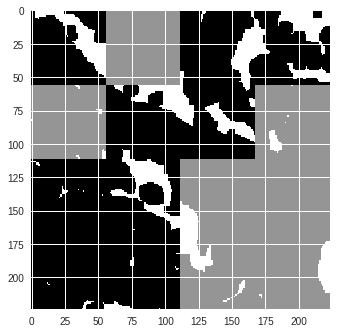

In [ ]:
plt.imshow(training_y[1000])

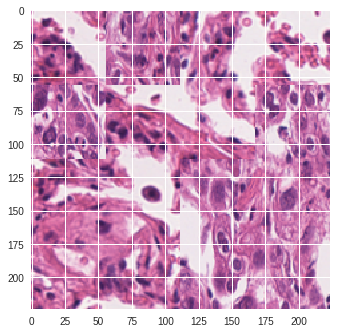

In [ ]:
plt.imshow(training_X[1000])

In [ ]:
class WSSS4LUAD_seg_train(Dataset):
  def __init__(self):
    self.x = np.array(training_X)
    self.masks = np.array(training_y_new)
    self.n_samples =  self.x.shape[0]
    

  def transform(self, image, mask):
    toPIL = transforms.ToPILImage()
    image = toPIL(image)
    mask = toPIL(mask)
    if random.random() >0.7:
      angle = random.randint(-30, 30)
      image = F.rotate(image,angle)
      mask = F.rotate(mask,angle)
    if random.random() >0.7:
      image = F.hflip(image)
      mask = F.hflip(mask)
    if random.random()>0.9:
      image = F.vflip(image)
      mask = F.vflip(mask)
    
    totens = transforms.ToTensor()
    image = totens(image)
    return image,np.array(mask)
    



  def __getitem__(self,index):
    image = self.x[index]
    mask = self.masks[index]
    image,mask = self.transform(image,mask)
    

    return image, mask

          
  
  def __len__(self):
    return self.n_samples

class WSSS4LUAD_seg_valid(Dataset):
  def __init__(self, img_transform=None,mask_transform=None):
    self.x = np.array(valid_X_data)
    self.masks = np.array(valid_mask_data)
    self.n_samples =  self.x.shape[0]
    self.img_transform = img_transform
    self.mask_transform = mask_transform


  def __getitem__(self,index):
    image = self.x[index]
    mask = self.masks[index]
    image = self.x[index]
    mask = self.masks[index]

    if self.img_transform is not None :
      image = self.img_transform(image)
    if self.mask_transform is not None: 
      mask = self.mask_transform(mask)
    return image, np.array(mask)

  def __len__(self):
    return self.n_samples



In [ ]:
img_transform = transforms.Compose([
     transforms.ToPILImage(),
     transforms.RandomRotation(degrees=45),
     transforms.RandomHorizontalFlip(p=0.5),
     transforms.RandomVerticalFlip(p=0.05),
     transforms.ToTensor()
    ])


mask_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomRotation(degrees=45),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.05),
    transforms.ToTensor()
    #transforms.ToPILImage(),
    #transforms.Resize(patch_size),
    ])


img_transform_valid = transforms.Compose([
     #transforms.ToPILImage(),
    
     transforms.ToTensor()
    ])


mask_transform_valid = transforms.Compose([
    #transforms.ToPILImage(),
    #transforms.Resize(patch_size),
    ])

## Cutmix

In [ ]:
def rand_bbox(size, lamb):
    """ Generate random bounding box 
    Args:
        - size: [width, breadth] of the bounding box
        - lamb: (lambda) cut ratio parameter, sampled from Beta distribution
    Returns:
        - Bounding box
    """

    # Generate random bounding box inside area 
    W = size[0]
    H = size[1]
    cut_rat = np.sqrt(1. - lamb)
    cut_w = np.int(W * cut_rat)
    cut_h = np.int(H * cut_rat)

    # uniform
    cx = np.random.randint(W)
    cy = np.random.randint(H)

    bbx1 = np.clip(cx - cut_w // 2, 0, W)
    bby1 = np.clip(cy - cut_h // 2, 0, H)
    bbx2 = np.clip(cx + cut_w // 2, 0, W)
    bby2 = np.clip(cy + cut_h // 2, 0, H)

    return bbx1, bby1, bbx2, bby2

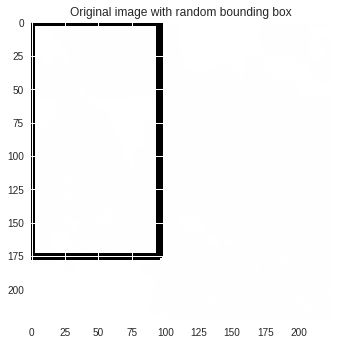

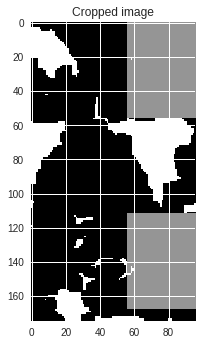

In [ ]:
image = training_y[25]

# Crop a random bounding box
lamb = 0.3
size = image.shape
#padding = get_padding(image)
bbox = rand_bbox(size, lamb)

# Draw bounding box on the image
im = image.copy()
x1 = bbox[0]
y1 = bbox[1]
x2 = bbox[2]
y2 = bbox[3]
cv2.rectangle(im, (x1, y1), (x2, y2), (255, 0, 0), 3)
plt.imshow(im);
plt.title('Original image with random bounding box')
plt.show();

# Show cropped image
plt.imshow(image[y1:y2, x1:x2]);
plt.title('Cropped image')
plt.show()

In [ ]:
def generate_cutmix_image(image_one,image_one_mask, image_two, image_two_mask, beta):
    ## Generate cutmix image specifically for one image at a time. 
    # generate mixed sample
    lam = np.random.beta(beta, beta)
 
    bbx1, bby1, bbx2, bby2 = rand_bbox(image_one.shape, lam)
    #raw_image = cv2.resize(image_two,(224,224))

    image_batch_updated = image_one.copy()
    image_batch_updated[bbx1:bbx2, bby1:bby2, :] = image_two[bbx1:bbx2, bby1:bby2, :]

    image_batch_mask_updated = image_one_mask.copy()
    image_batch_mask_updated[bbx1:bbx2, bby1:bby2] = image_two_mask[bbx1:bbx2, bby1:bby2]

    
    return image_batch_updated, image_batch_mask_updated

In [ ]:
def produce_all_cutmix_images():
  pairings = [[(training_X[:300],training_y[:300]),(training_X[300:600],training_y[300:600])], [(training_X[700:1000],training_y[700:1000]), (training_X[1000:1300],training_y[1000:1300])]]
  cutmix_images = list()
  cutmix_masks = list()
  for pair in pairings:
    print(len(pair[0][0]))

    for i in range(300):
      
      cutmix_image, cutmix_mask = generate_cutmix_image(pair[0][0][i],pair[0][1][i], pair[1][0][i],pair[1][1][i],1.0)
      cutmix_images.append(cutmix_image)
      cutmix_masks.append(cutmix_mask)


  return cutmix_images, cutmix_masks


In [ ]:
cutmix_images, cutmix_masks = produce_all_cutmix_images()

300
300


In [ ]:
training_X.extend(cutmix_images)
training_y.extend(cutmix_masks)

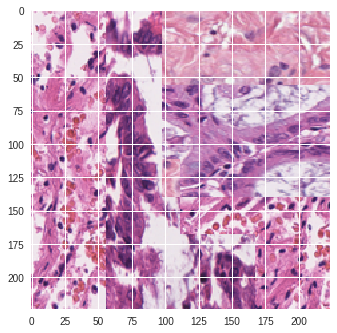

In [ ]:
plt.imshow(training_X[2000])

## Model Creation

In [ ]:
model = smp.DeepLabV3Plus(
    encoder_name="resnet50",        # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights=None,     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=3,                      # model output channels (number of classes in your dataset)
).to(device)

In [ ]:
optim = torch.optim.Adam(model.parameters(), lr=0.001) # Adam is going to be the most robust

criterion = nn.CrossEntropyLoss(reduce=False)


In [ ]:
segmentation_train = WSSS4LUAD_seg_train()
dataloader_segmentation_train = DataLoader(dataset = segmentation_train, batch_size = 32, shuffle = True)

In [ ]:
def seg_train (dataloader, model, optimizer, loss_function,test_batch=None):
  progress = tqdm(dataloader)  
  train_loss = 0
  count = 0
  model.train()
  
  for batch_idx, (data, masks) in enumerate(progress):
    count += 1 
    data = data.type(torch.FloatTensor)
    
    X = data.to(device)
    y = masks.type('torch.LongTensor').to(device)

    with torch.set_grad_enabled(True):
      predictions = model(X)
      loss = loss_function(predictions,y)
      optimizer.zero_grad()
      loss = loss.mean()
      train_loss += loss
      #print(loss)
      loss.backward()
      optimizer.step()

     
  print(train_loss/count)
  progress.set_postfix({'Train loss': train_loss/count})    
  return train_loss/count

In [ ]:
def pre_train(dataloader,model,optimizer,loss_function,EPOCHS):
  training_loss_compiled = list()  
  for epoch in range(EPOCHS):
      print(f"Epoch {epoch+1} of {EPOCHS}")
      train_epoch_loss = seg_train(
           dataloader, model, optimizer, loss_function
      )
      training_loss_compiled.append(train_epoch_loss)
  return training_loss_compiled


In [ ]:
pre_train(dataloader_segmentation_train,model, optim, criterion, 2)

In [ ]:
torch.save({
              'epoch': 12,
              'model_state_dict': model.state_dict(),
              'optimizer_state_dict': optim.state_dict(),
              'loss': criterion,
              }, '/content/gdrive/MyDrive/deeplabplus_50_tumour_other_before.pth')

# PredictMultiClass_images

In [ ]:
class WSSS4LUAD_seg_new(Dataset):
  def __init__(self):
    self.x = np.array(non_single_class_images)
    self.n_samples =  self.x.shape[0]
    


  def __getitem__(self,index):
    image = self.x[index]
    toPIL = transforms.ToPILImage()
    image = toPIL(image)
    totens = transforms.ToTensor()
    image = totens(image)

    
    return image

  def __len__(self):
    return self.n_samples


In [ ]:
segmentation_new = WSSS4LUAD_seg_new()
dataloader_segmentation_new = DataLoader(dataset = segmentation_new, batch_size = 1, shuffle = False)

In [ ]:
def compose_pseudo_masks (dataloader, model):
  progress = tqdm(dataloader)  
  model.eval()
  all_predictions = list()
  
  for batch_idx, (data) in enumerate(progress):
    
    data = data.type(torch.FloatTensor)
    X = data.to(device)
    
    with torch.set_grad_enabled(False):
       predictions = model(X)
       # Create 4d from prediction
       p=predictions[:,:,:,:].detach().cpu()
       cpred=np.argmax(p,axis=1)
       all_predictions.append(cpred)
       
  
  

  return all_predictions

In [ ]:
predictions = compose_pseudo_masks(dataloader_segmentation_new, model)

100%|██████████| 5398/5398 [01:26<00:00, 62.29it/s]


([], <a list of 0 Text yticklabel objects>)

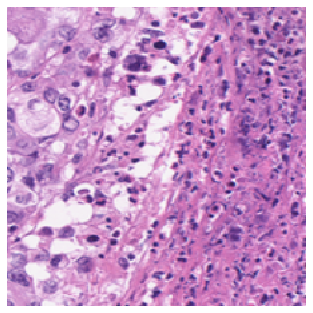

In [ ]:
plt.imshow(non_single_class_images[1])
plt.grid(None)

plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

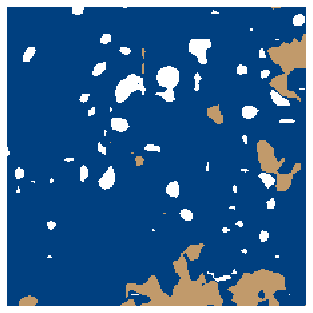

In [ ]:
plt.imshow(create_example(predictions[0].reshape(224,224)))
plt.grid(None)
plt.xticks([])
plt.yticks([])

In [ ]:
def create_example(mask):
    mask = mask
    this_mask = np.zeros((mask.shape[0],mask.shape[1],3),dtype=np.uint8)
    for i in range(len(mask)):
      for j in range(len(mask[0])):
        if mask[i][j] == 0:
          this_mask[i][j] = [255,255,255]
        elif mask[i][j] == 1:
          this_mask[i][j] = [0,64,128]
        elif mask[i][j] == 2:
          this_mask[i][j] = [193,154,107]
        
    
    return this_mask 

([], <a list of 0 Text yticklabel objects>)

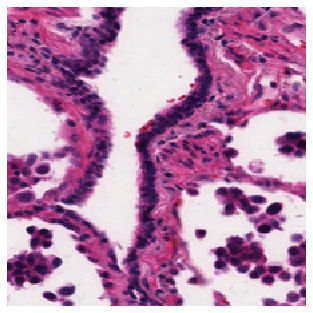

In [ ]:
plt.imshow(non_single_class_images[50])
plt.grid(None)

plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

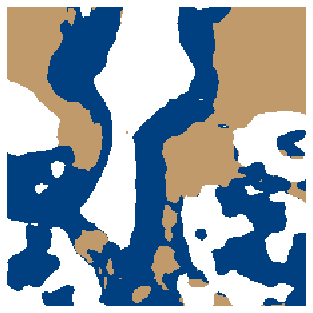

In [ ]:
plt.imshow(create_example(predictions[50].reshape(224,224)))
plt.grid(None)
plt.xticks([])
plt.yticks([])

In [ ]:
numpy_predictions = [prediction.numpy().reshape(224,224) for prediction in predictions]

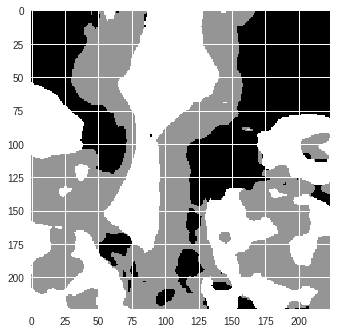

In [ ]:
plt.imshow(numpy_predictions[50])

In [ ]:
for i in range(len(non_single_class_images)):
  number = str(i)
  with open('/content/gdrive/MyDrive/predictions_of_multi_class_images_other/images/'+number+'.npy', 'wb') as f:
      np.save(f, non_single_class_images[i])
  with open('/content/gdrive/MyDrive/predictions_of_multi_class_images_other/masks/'+number+'.npy', 'wb') as f:
      np.save(f, numpy_predictions[i])

## Unzip Images

In [ ]:
!unzip "/content/gdrive/MyDrive/Whole_masks.zip" -d "/content"


Streaming output truncated to the last 5000 lines.
  inflating: /content/Whole_masks/masks/tumour/295.npy  
  inflating: /content/Whole_masks/masks/stroma/915.npy  
  inflating: /content/Whole_masks/masks/tumour/294.npy  
  inflating: /content/Whole_masks/images/tumour/147.npy  
  inflating: /content/Whole_masks/images/stroma/985.npy  
  inflating: /content/Whole_masks/images/tumour/138.npy  
  inflating: /content/Whole_masks/masks/stroma/914.npy  
  inflating: /content/Whole_masks/images/tumour/133.npy  
  inflating: /content/Whole_masks/masks/stroma/916.npy  
  inflating: /content/Whole_masks/masks/tumour/293.npy  
  inflating: /content/Whole_masks/images/tumour/130.npy  
  inflating: /content/Whole_masks/images/tumour/136.npy  
  inflating: /content/Whole_masks/masks/stroma/913.npy  
  inflating: /content/Whole_masks/images/tumour/140.npy  
  inflating: /content/Whole_masks/images/stroma/981.npy  
  inflating: /content/Whole_masks/images/stroma/979.npy  
  inflating: /content/Whole_

In [ ]:
tumour_i = list()
tumour_masks = list()

stroma_i = list()
stroma_masks = list()

normal_i = list()
normal_masks = list()
for i in range(len(only_tumour_i)):
  number = str(i)
  tumour_i.append(np.load('/content/Whole_masks/images/tumour/'+number+'.npy'))
  tumour_masks.append(np.load('/content/Whole_masks/masks/tumour/'+number+'.npy'))

for i in range(len(only_stroma_i)):
  number = str(i)
  stroma_i.append(np.load('/content/Whole_masks/images/stroma/'+number+'.npy'))
  stroma_masks.append(np.load('/content/Whole_masks/masks/stroma/'+number+'.npy'))

for i in range(len(only_normal_i)):
  number = str(i)
  normal_i.append(np.load('/content/Whole_masks/images/normal/'+number+'.npy'))
  normal_masks.append(np.load('/content/Whole_masks/masks/normal/'+number+'.npy'))

In [ ]:
def create_testing_masks(masks):
  new_masks = list()
  for mask in masks:
    this_mask = mask.copy()
    this_mask = this_mask[:, :,1]
    
    np.putmask(this_mask, this_mask == 0, 0)
    np.putmask(this_mask, this_mask == 255, 0)
    np.putmask(this_mask, this_mask == 64, 1)
    np.putmask(this_mask, this_mask == 128, 2)
    np.putmask(this_mask, this_mask == 152, 2)
    new_masks.append(this_mask)
  return new_masks 

In [ ]:
training_X = list()
training_y_new = list()

training_X.extend(tumour_i)
training_y_new.extend(tumour_masks)

training_X.extend(stroma_i)
training_y_new.extend(stroma_masks)


training_X.extend(normal_i)
training_y_new.extend(normal_masks)

In [ ]:
training_y_new = create_testing_masks(training_y_new)

([], <a list of 0 Text yticklabel objects>)

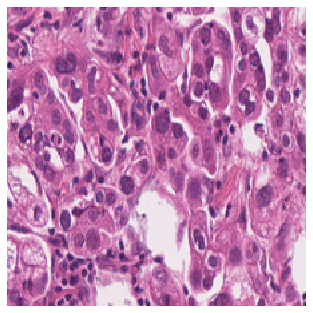

In [ ]:
plt.imshow(training_X[1000])
plt.grid(False)
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

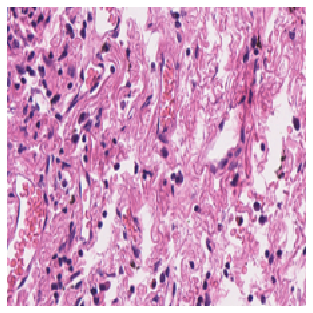

In [ ]:
plt.imshow(training_X[2000])
plt.grid(False)
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

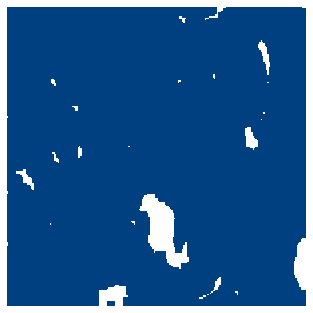

In [ ]:
plt.imshow(create_example(training_y_new[1000]))
plt.grid(False)
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

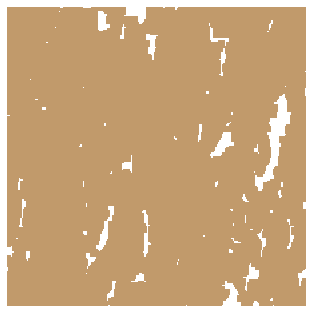

In [ ]:
plt.imshow(create_example(training_y_new[2000]))
plt.grid(False)
plt.xticks([])
plt.yticks([])

In [ ]:
training_y[0]

array([[1, 1, 1, ..., 2, 2, 2],
       [1, 1, 1, ..., 2, 2, 2],
       [1, 1, 1, ..., 2, 2, 2],
       ...,
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2]], dtype=uint8)

In [ ]:
numpy_predictions = [mask.astype(np.uint8) for mask in numpy_predictions]

In [ ]:
len(training_y_new)

10091

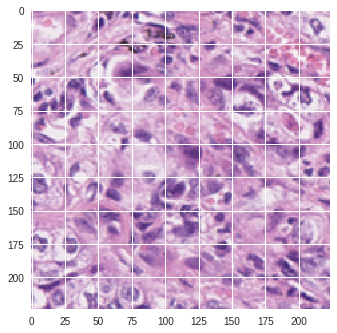

In [ ]:
plt.imshow(training_X[6000
                      ])

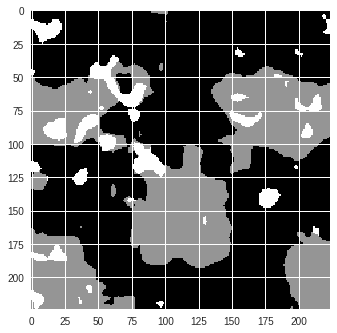

In [ ]:
plt.imshow(training_y_new[6000])

In [ ]:
training_X.extend(non_single_class_images)
training_y_new.extend(numpy_predictions)

In [ ]:
def get_padding(image):
   
    
    #imsize = image.size
    height = image.shape[0]
    width = image.shape[1]


    height_padding = height % 16
    width_padding = width % 16
    
    if (height_padding!=0):
      height_padding = 16 - height_padding 
    if (width_padding!=0):
      width_padding = 16 - width_padding 

    top_padding = math.ceil(height_padding/2)
    bottom_padding = math.floor(height_padding/2)

    right_padding =math.ceil(width_padding/2)


    left_padding = math.floor(width_padding/2)
    

    print(height_padding)

    print(width_padding)
    print('done')

 
    
    padding = (int(top_padding), int(bottom_padding), int(left_padding), int(right_padding))
    
    return padding


In [ ]:
def sort_data(file_loc_data ,directory):
  test_X_data = list()
  test_y_data = list()
  test_mask_data = list()
  # Sort validation data 
  for i in range(len(file_loc_data)):
    # We need to sort if the image is large or not
    io=cv2.cvtColor(cv2.imread(file_loc_data[i]),cv2.COLOR_BGR2RGB)
    io_mask = cv2.cvtColor(cv2.imread(directory+'/mask'+file_loc_data[i][-7:]),cv2.COLOR_BGR2RGB)
    count = 0 
    interp_method=PIL.Image.BICUBIC
    io = cv2.resize(io,(0,0),fx=1,fy=1, interpolation=interp_method) #resize it as specified above
    io_mask = cv2.resize(io_mask,(0,0),fx=1,fy=1, interpolation=interp_method) #resize it as specified above
    all_padding = get_padding(io)
    print(io.shape)

    io = np.pad(io, pad_width=((all_padding[0], all_padding[1]), (all_padding[2], all_padding[3]),(0,0)))
    io_mask = np.pad(io_mask, pad_width=((all_padding[0], all_padding[1]), (all_padding[2], all_padding[3]),(0,0)))
    print(io.shape)

    io_mask_map = map(int,[(io_mask == (0,64,128)).all(axis=-1).max(), (io_mask == (64,128,0)).all(axis=-1).max(), (io_mask == (243,152,0)).all(axis=-1).max()])
    io_mask_y_int = list(io_mask_map)
    test_X_data.append(io)
    test_y_data.append(io_mask_y_int)
    test_mask_data.append(io_mask)
  return test_X_data, test_y_data, test_mask_data


In [ ]:
#Match the ground truth to the training image
X_image_strings_valid = list()
y_valid_strings = list()

for image_string in os.listdir(validation_directory+'/img'):
    X_image_strings_valid.append(os.path.join(validation_directory+'img',image_string))
for image_string in os.listdir(validation_directory+'/mask'):
    y_valid_strings.append(os.path.join(validation_directory+'mask',image_string))


In [ ]:
valid_X_data, valid_y_data, valid_mask_data = sort_data(X_image_strings_valid, validation_directory)

11
12
done
(485, 276, 3)
(496, 288, 3)
15
6
done
(273, 266, 3)
(288, 272, 3)
13
0
done
(291, 352, 3)
(304, 352, 3)
3
14
done
(269, 242, 3)
(272, 256, 3)
12
2
done
(452, 398, 3)
(464, 400, 3)
11
1
done
(341, 223, 3)
(352, 224, 3)
11
5
done
(485, 475, 3)
(496, 480, 3)
3
5
done
(349, 251, 3)
(352, 256, 3)
6
1
done
(458, 255, 3)
(464, 256, 3)
4
14
done
(428, 274, 3)
(432, 288, 3)
11
12
done
(293, 228, 3)
(304, 240, 3)
12
3
done
(500, 365, 3)
(512, 368, 3)
10
7
done
(454, 313, 3)
(464, 320, 3)
14
13
done
(370, 419, 3)
(384, 432, 3)
1
2
done
(287, 350, 3)
(288, 352, 3)
0
10
done
(400, 310, 3)
(400, 320, 3)
4
15
done
(236, 353, 3)
(240, 368, 3)
11
7
done
(389, 233, 3)
(400, 240, 3)
15
3
done
(465, 397, 3)
(480, 400, 3)
15
13
done
(337, 227, 3)
(352, 240, 3)
3
13
done
(493, 243, 3)
(496, 256, 3)
3
8
done
(237, 280, 3)
(240, 288, 3)
11
11
done
(341, 245, 3)
(352, 256, 3)
6
7
done
(474, 217, 3)
(480, 224, 3)
14
9
done
(498, 327, 3)
(512, 336, 3)
2
8
done
(206, 248, 3)
(208, 256, 3)
13
8
done
(41

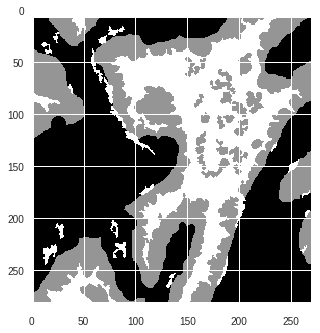

In [ ]:
plt.imshow(valid_mask_data[1])

In [ ]:
valid_mask_data = create_testing_masks(valid_mask_data)

In [ ]:
def seg_validate (dataloader, model, optimizer, loss_function):
  progress = tqdm(dataloader)  
  model.eval()
  jaccard = JaccardIndex(num_classes=3, average='none')
  IoU_background = 0.0
  IoU_tumour = 0.0
  IoU_other = 0.0
  cmatrix = np.zeros((4,4))
  tumour_count = 29  
  other_count = 35
  count = 0


  for batch_idx, (data, masks) in enumerate(progress):
    count += 1 
    data = data.type(torch.FloatTensor)
    X = data.to(device)
    y = masks.type('torch.LongTensor').to(device)

    with torch.set_grad_enabled(False):
       predictions = model(X)
       # Create 4d from prediction
       p=predictions[:,:,:,:].detach().cpu()
       cpred=np.argmax(p,axis=1)
       y_cpu=y.cpu()
       print(y_cpu.shape)
       print(cpred.shape)

       jaccard_batch_metric = jaccard(cpred,y_cpu)
       print(jaccard_batch_metric)
       IoU_background += jaccard_batch_metric[0]
       IoU_tumour += jaccard_batch_metric[1]
       IoU_other += jaccard_batch_metric[2]
       cpredflat = cpred.flatten()
       yflat = y_cpu.flatten()

       #cmatrix=cmatrix+confusion_matrix(yflat,cpredflat,labels=range(3))
  
  all_metrics = {
      #'Accuracy': (cmatrix/cmatrix.sum()).trace(),
      'IoU Tumour': IoU_tumour/tumour_count,
      'IoU Other':IoU_other/other_count,
      'IoU Background':IoU_background/count,
  }

  return all_metrics, cmatrix 

  


In [ ]:
segmentation_train = WSSS4LUAD_seg_train()
dataloader_segmentation_train = DataLoader(dataset = segmentation_train, batch_size = 32, shuffle = True)
segmentation_valid = WSSS4LUAD_seg_valid(img_transform_valid,mask_transform_valid)
dataloader_segmentation_valid = DataLoader(dataset = segmentation_valid, batch_size = 1, shuffle = False)


In [ ]:
dl = {'train':dataloader_segmentation_train,
               'val':dataloader_segmentation_valid}


In [ ]:
valid_epoch_metrics = seg_validate(
          dl['val'], model, optim, criterion
      )

  9%|▉         | 3/33 [00:00<00:02, 13.80it/s]

torch.Size([1, 496, 288])
torch.Size([1, 496, 288])
tensor([0.8580, 0.0000, 0.7385])
torch.Size([1, 288, 272])
torch.Size([1, 288, 272])
tensor([0.8150, 0.4602, 0.4322])
torch.Size([1, 304, 352])
torch.Size([1, 304, 352])
tensor([0.5998, 0.7475, 0.0824])


 15%|█▌        | 5/33 [00:00<00:02, 13.06it/s]

torch.Size([1, 272, 256])
torch.Size([1, 272, 256])
tensor([0.5517, 0.0000, 0.8257])
torch.Size([1, 464, 400])
torch.Size([1, 464, 400])
tensor([0.8076, 0.5053, 0.8235])
torch.Size([1, 352, 224])
torch.Size([1, 352, 224])
tensor([0.7930, 0.0000, 0.8598])


 21%|██        | 7/33 [00:00<00:02, 11.66it/s]

torch.Size([1, 496, 480])
torch.Size([1, 496, 480])
tensor([0.7506, 0.6296, 0.5874])
torch.Size([1, 352, 256])
torch.Size([1, 352, 256])
tensor([0.6936, 0.6270, 0.0763])
torch.Size([1, 464, 256])
torch.Size([1, 464, 256])


 33%|███▎      | 11/33 [00:00<00:01, 13.45it/s]

tensor([0.7827, 0.0000, 0.8059])
torch.Size([1, 432, 288])
torch.Size([1, 432, 288])
tensor([0.7796, 0.1978, 0.7757])
torch.Size([1, 304, 240])
torch.Size([1, 304, 240])
tensor([0.7303, 0.5335, 0.9209])
torch.Size([1, 512, 368])
torch.Size([1, 512, 368])


 39%|███▉      | 13/33 [00:01<00:01, 11.97it/s]

tensor([0.8656, 0.2965, 0.4475])
torch.Size([1, 464, 320])
torch.Size([1, 464, 320])
tensor([0.8497, 0.3772, 0.2312])
torch.Size([1, 384, 432])
torch.Size([1, 384, 432])
tensor([0.7898, 0.5399, 0.2139])


 52%|█████▏    | 17/33 [00:01<00:01, 12.55it/s]

torch.Size([1, 288, 352])
torch.Size([1, 288, 352])
tensor([0.7433, 0.6403, 0.5661])
torch.Size([1, 400, 320])
torch.Size([1, 400, 320])
tensor([0.8230, 0.0000, 0.9276])
torch.Size([1, 240, 368])
torch.Size([1, 240, 368])
tensor([0.7683, 0.0000, 0.8469])


 58%|█████▊    | 19/33 [00:01<00:01, 11.61it/s]

torch.Size([1, 400, 240])
torch.Size([1, 400, 240])
tensor([0.1795, 0.0597, 0.2091])
torch.Size([1, 480, 400])
torch.Size([1, 480, 400])
tensor([0.6170, 0.0000, 0.7925])
torch.Size([1, 352, 240])
torch.Size([1, 352, 240])


 70%|██████▉   | 23/33 [00:01<00:00, 13.70it/s]

tensor([0.7650, 0.7945, 0.5997])
torch.Size([1, 496, 256])
torch.Size([1, 496, 256])
tensor([0.5551, 0.5941, 0.4914])
torch.Size([1, 240, 288])
torch.Size([1, 240, 288])
tensor([0.7718, 0.4977, 0.4367])
torch.Size([1, 352, 256])
torch.Size([1, 352, 256])
tensor([0.7315, 0.4827, 0.1590])


 76%|███████▌  | 25/33 [00:01<00:00, 12.98it/s]

torch.Size([1, 480, 224])
torch.Size([1, 480, 224])
tensor([0.4453, 0.6109, 0.3613])
torch.Size([1, 512, 336])
torch.Size([1, 512, 336])
tensor([0.8398, 0.7125, 0.8013])
torch.Size([1, 208, 256])
torch.Size([1, 208, 256])
tensor([0.8208, 0.8863, 0.8382])


 82%|████████▏ | 27/33 [00:02<00:00, 12.61it/s]

torch.Size([1, 432, 480])
torch.Size([1, 432, 480])
tensor([0.8435, 0.7243, 0.3284])
torch.Size([1, 256, 304])
torch.Size([1, 256, 304])
tensor([0.8701, 0.7732, 0.5674])
torch.Size([1, 352, 352])
torch.Size([1, 352, 352])


 94%|█████████▍| 31/33 [00:02<00:00, 12.75it/s]

tensor([0.7692, 0.5476, 0.7621])
torch.Size([1, 240, 480])
torch.Size([1, 240, 480])
tensor([0.6173, 0.9056, 0.5869])
torch.Size([1, 336, 496])
torch.Size([1, 336, 496])
tensor([0.7492, 0.7788, 0.3006])
torch.Size([1, 1584, 1344])
torch.Size([1, 1584, 1344])
tensor([0.8078, 0.6058, 0.6481])
torch.Size([1, 1728, 1728])
torch.Size([1, 1728, 1728])


100%|██████████| 33/33 [00:04<00:00,  6.61it/s]

tensor([0.5756, 0.4590, 0.4346])


In [ ]:
valid_epoch_metrics[0]

{'IoU Tumour': tensor(0.5168),
 'IoU Normal': tensor(0.5280),
 'IoU Background': tensor(0.7261)}

In [ ]:
optim = torch.optim.Adam(model.parameters(), lr=0.0005) # Adam is going to be the most robust


In [ ]:
# start the training and validation

def full_training_and_val(dataloaders, model,optimizer, loss_function, EPOCHS):
  train_loss_compiled = list()
  validation_IoUs_compiled = list()
  validation_cmatrix = list()
  best_tumour_accuracy = float('-inf')

  for epoch in range(EPOCHS):
      print(f"Epoch {epoch+1} of {EPOCHS}")
      train_epoch_loss = seg_train(
           dataloaders['train'], model, optimizer, loss_function
      )
      valid_epoch_metrics = seg_validate(
          dataloaders['val'], model, optimizer, loss_function
      )

      print(valid_epoch_metrics[0])

      if best_tumour_accuracy < valid_epoch_metrics[0]['IoU Tumour']:
        best_tumour_accuracy = valid_epoch_metrics[0]['IoU Tumour']
        torch.save({
              'epoch': EPOCHS,
              'model_state_dict': model.state_dict(),
              'optimizer_state_dict': optimizer.state_dict(),
              'loss': criterion,
              }, '/content/gdrive/MyDrive/deeplabplus_50_grid_other.pth')
        
      train_loss_compiled.append(train_epoch_loss)
      validation_IoUs_compiled.append(valid_epoch_metrics[0])
      validation_cmatrix.append(valid_epoch_metrics[1])




  return train_loss_compiled,validation_IoUs_compiled, validation_cmatrix, best_tumour_accuracy

In [ ]:
train_val = full_training_and_val(dl,model, optim, criterion, 9)

Epoch 1 of 9


100%|██████████| 316/316 [05:39<00:00,  1.07s/it]


tensor(0.3048, device='cuda:0', grad_fn=<DivBackward0>)


  6%|▌         | 2/33 [00:00<00:02, 13.92it/s]

torch.Size([1, 496, 288])
torch.Size([1, 496, 288])
tensor([0.8613, 0.0000, 0.7381])
torch.Size([1, 288, 272])
torch.Size([1, 288, 272])
tensor([0.8166, 0.5164, 0.5608])
torch.Size([1, 304, 352])
torch.Size([1, 304, 352])
tensor([0.5010, 0.7457, 0.2225])


 12%|█▏        | 4/33 [00:00<00:01, 15.32it/s]

torch.Size([1, 272, 256])
torch.Size([1, 272, 256])
tensor([0.4850, 0.0000, 0.7421])
torch.Size([1, 464, 400])
torch.Size([1, 464, 400])
tensor([0.8150, 0.4153, 0.7656])
torch.Size([1, 352, 224])
torch.Size([1, 352, 224])


 18%|█▊        | 6/33 [00:00<00:01, 14.06it/s]

tensor([0.7479, 0.0000, 0.8372])


 24%|██▍       | 8/33 [00:00<00:01, 12.51it/s]

torch.Size([1, 496, 480])
torch.Size([1, 496, 480])
tensor([0.7262, 0.6374, 0.6287])
torch.Size([1, 352, 256])
torch.Size([1, 352, 256])
tensor([0.5553, 0.6401, 0.3030])
torch.Size([1, 464, 256])
torch.Size([1, 464, 256])


 30%|███       | 10/33 [00:00<00:01, 12.75it/s]

tensor([0.7724, 0.0000, 0.8003])
torch.Size([1, 432, 288])
torch.Size([1, 432, 288])
tensor([0.7209, 0.3925, 0.8048])
torch.Size([1, 304, 240])
torch.Size([1, 304, 240])
tensor([0.7536, 0.4485, 0.9164])
torch.Size([1, 512, 368])
torch.Size([1, 512, 368])


 36%|███▋      | 12/33 [00:00<00:01, 12.67it/s]

tensor([0.8684, 0.3446, 0.5700])
torch.Size([1, 464, 320])
torch.Size([1, 464, 320])
tensor([0.8388, 0.4434, 0.4488])
torch.Size([1, 384, 432])
torch.Size([1, 384, 432])


 42%|████▏     | 14/33 [00:01<00:01, 12.10it/s]

tensor([0.7448, 0.6025, 0.4911])


 48%|████▊     | 16/33 [00:01<00:01, 12.35it/s]

torch.Size([1, 288, 352])
torch.Size([1, 288, 352])
tensor([0.6551, 0.6529, 0.6317])
torch.Size([1, 400, 320])
torch.Size([1, 400, 320])
tensor([0.8320, 0.0000, 0.9309])
torch.Size([1, 240, 368])
torch.Size([1, 240, 368])
tensor([0.7741, 0.0667, 0.8526])


 55%|█████▍    | 18/33 [00:01<00:01, 13.50it/s]

torch.Size([1, 400, 240])
torch.Size([1, 400, 240])
tensor([1.4388e-01, 7.3228e-05, 2.0373e-01])
torch.Size([1, 480, 400])
torch.Size([1, 480, 400])
tensor([0.5908, 0.0274, 0.7816])
torch.Size([1, 352, 240])
torch.Size([1, 352, 240])


 67%|██████▋   | 22/33 [00:01<00:00, 13.73it/s]

tensor([0.7146, 0.7983, 0.6569])
torch.Size([1, 496, 256])
torch.Size([1, 496, 256])
tensor([0.5855, 0.3753, 0.4097])
torch.Size([1, 240, 288])
torch.Size([1, 240, 288])
tensor([0.7508, 0.5352, 0.5257])
torch.Size([1, 352, 256])
torch.Size([1, 352, 256])
tensor([0.7182, 0.5946, 0.5497])


 79%|███████▉  | 26/33 [00:01<00:00, 14.41it/s]

torch.Size([1, 480, 224])
torch.Size([1, 480, 224])
tensor([0.4592, 0.6335, 0.3848])
torch.Size([1, 512, 336])
torch.Size([1, 512, 336])
tensor([0.8480, 0.7748, 0.8634])
torch.Size([1, 208, 256])
torch.Size([1, 208, 256])
tensor([0.8219, 0.8904, 0.8538])


 85%|████████▍ | 28/33 [00:02<00:00, 13.48it/s]

torch.Size([1, 432, 480])
torch.Size([1, 432, 480])
tensor([0.6973, 0.7114, 0.4903])
torch.Size([1, 256, 304])
torch.Size([1, 256, 304])
tensor([0.8690, 0.8091, 0.6990])
torch.Size([1, 352, 352])
torch.Size([1, 352, 352])


 91%|█████████ | 30/33 [00:02<00:00, 13.49it/s]

tensor([0.6534, 0.1507, 0.7326])
torch.Size([1, 240, 480])
torch.Size([1, 240, 480])
tensor([0.4330, 0.7947, 0.3325])
torch.Size([1, 336, 496])
torch.Size([1, 336, 496])
tensor([0.7607, 0.6576, 0.3433])
torch.Size([1, 1584, 1344])
torch.Size([1, 1584, 1344])


 97%|█████████▋| 32/33 [00:03<00:00,  4.41it/s]

tensor([0.8302, 0.6557, 0.7038])
torch.Size([1, 1728, 1728])
torch.Size([1, 1728, 1728])


100%|██████████| 33/33 [00:04<00:00,  6.77it/s]

tensor([0.3954, 0.0032, 0.5697])
{'IoU Tumour': tensor(0.4937), 'IoU Other': tensor(0.5813), 'IoU Background': tensor(0.6891)}


Epoch 2 of 9


100%|██████████| 316/316 [05:39<00:00,  1.07s/it]


tensor(0.2944, device='cuda:0', grad_fn=<DivBackward0>)


  6%|▌         | 2/33 [00:00<00:02, 14.90it/s]

torch.Size([1, 496, 288])
torch.Size([1, 496, 288])
tensor([0.8693, 0.0000, 0.7542])
torch.Size([1, 288, 272])
torch.Size([1, 288, 272])
tensor([0.8230, 0.5086, 0.5357])
torch.Size([1, 304, 352])
torch.Size([1, 304, 352])
tensor([0.6227, 0.7204, 0.3964])
torch.Size([1, 272, 256])
torch.Size([1, 272, 256])


 12%|█▏        | 4/33 [00:00<00:01, 15.47it/s]

tensor([0.4777, 0.0000, 0.8580])
torch.Size([1, 464, 400])
torch.Size([1, 464, 400])
tensor([0.8207, 0.4797, 0.7963])
torch.Size([1, 352, 224])
torch.Size([1, 352, 224])


 18%|█▊        | 6/33 [00:00<00:01, 13.96it/s]

tensor([0.7764, 0.0000, 0.8513])
torch.Size([1, 496, 480])
torch.Size([1, 496, 480])


 24%|██▍       | 8/33 [00:00<00:02, 12.35it/s]

tensor([0.7483, 0.6481, 0.6256])
torch.Size([1, 352, 256])
torch.Size([1, 352, 256])
tensor([0.6795, 0.6887, 0.4119])
torch.Size([1, 464, 256])
torch.Size([1, 464, 256])
tensor([0.7947, 0.0000, 0.8169])
torch.Size([1, 432, 288])
torch.Size([1, 432, 288])


 30%|███       | 10/33 [00:00<00:01, 12.61it/s]

tensor([0.7421, 0.2048, 0.8235])
torch.Size([1, 304, 240])
torch.Size([1, 304, 240])
tensor([0.7329, 0.5254, 0.9143])


 36%|███▋      | 12/33 [00:00<00:01, 12.57it/s]

torch.Size([1, 512, 368])
torch.Size([1, 512, 368])
tensor([0.8734, 0.3484, 0.6026])
torch.Size([1, 464, 320])
torch.Size([1, 464, 320])
tensor([0.8502, 0.4974, 0.5556])
torch.Size([1, 384, 432])
torch.Size([1, 384, 432])


 42%|████▏     | 14/33 [00:01<00:01, 11.94it/s]

tensor([0.7837, 0.6051, 0.4481])
torch.Size([1, 288, 352])
torch.Size([1, 288, 352])
tensor([0.7197, 0.6685, 0.6333])
torch.Size([1, 400, 320])
torch.Size([1, 400, 320])


 48%|████▊     | 16/33 [00:01<00:01, 12.48it/s]

tensor([0.8462, 0.0000, 0.9354])
torch.Size([1, 240, 368])
torch.Size([1, 240, 368])


 55%|█████▍    | 18/33 [00:01<00:01, 13.53it/s]

tensor([0.7879, 0.0874, 0.8578])
torch.Size([1, 400, 240])
torch.Size([1, 400, 240])
tensor([0.1720, 0.0037, 0.2075])
torch.Size([1, 480, 400])
torch.Size([1, 480, 400])
tensor([0.6274, 0.0000, 0.7963])
torch.Size([1, 352, 240])
torch.Size([1, 352, 240])


 67%|██████▋   | 22/33 [00:01<00:00, 13.68it/s]

tensor([0.7755, 0.7635, 0.6176])
torch.Size([1, 496, 256])
torch.Size([1, 496, 256])
tensor([0.6883, 0.5384, 0.4929])
torch.Size([1, 240, 288])
torch.Size([1, 240, 288])
tensor([0.7681, 0.5576, 0.5633])
torch.Size([1, 352, 256])
torch.Size([1, 352, 256])
tensor([0.7363, 0.6221, 0.6551])


 73%|███████▎  | 24/33 [00:01<00:00, 14.11it/s]

torch.Size([1, 480, 224])
torch.Size([1, 480, 224])
tensor([0.6222, 0.6616, 0.4320])
torch.Size([1, 512, 336])
torch.Size([1, 512, 336])


 79%|███████▉  | 26/33 [00:01<00:00, 13.87it/s]

tensor([0.8435, 0.7363, 0.8222])
torch.Size([1, 208, 256])
torch.Size([1, 208, 256])
tensor([0.8258, 0.8939, 0.8604])
torch.Size([1, 432, 480])
torch.Size([1, 432, 480])
tensor([0.8261, 0.7477, 0.4630])
torch.Size([1, 256, 304])
torch.Size([1, 256, 304])


 85%|████████▍ | 28/33 [00:02<00:00, 13.20it/s]

tensor([0.8747, 0.8043, 0.6800])
torch.Size([1, 352, 352])
torch.Size([1, 352, 352])


 91%|█████████ | 30/33 [00:02<00:00, 13.27it/s]

tensor([0.7756, 0.4173, 0.7323])
torch.Size([1, 240, 480])
torch.Size([1, 240, 480])
tensor([0.5439, 0.8673, 0.4949])
torch.Size([1, 336, 496])
torch.Size([1, 336, 496])
tensor([0.7700, 0.7283, 0.3944])
torch.Size([1, 1584, 1344])
torch.Size([1, 1584, 1344])


 97%|█████████▋| 32/33 [00:03<00:00,  4.51it/s]

tensor([0.8424, 0.6565, 0.6972])
torch.Size([1, 1728, 1728])
torch.Size([1, 1728, 1728])


100%|██████████| 33/33 [00:04<00:00,  6.75it/s]

tensor([0.5604, 0.3077, 0.6366])
{'IoU Tumour': tensor(0.5272), 'IoU Other': tensor(0.6104), 'IoU Background': tensor(0.7333)}


Epoch 3 of 9


100%|██████████| 316/316 [05:39<00:00,  1.07s/it]


tensor(0.2840, device='cuda:0', grad_fn=<DivBackward0>)


  6%|▌         | 2/33 [00:00<00:02, 13.98it/s]

torch.Size([1, 496, 288])
torch.Size([1, 496, 288])
tensor([0.7342, 0.0000, 0.6088])
torch.Size([1, 288, 272])
torch.Size([1, 288, 272])
tensor([0.8207, 0.4258, 0.3261])
torch.Size([1, 304, 352])
torch.Size([1, 304, 352])
tensor([0.4737, 0.7248, 0.0000])


 12%|█▏        | 4/33 [00:00<00:01, 15.48it/s]

torch.Size([1, 272, 256])
torch.Size([1, 272, 256])
tensor([0.3314, 0.0000, 0.8332])
torch.Size([1, 464, 400])
torch.Size([1, 464, 400])
tensor([0.7562, 0.5262, 0.8090])
torch.Size([1, 352, 224])
torch.Size([1, 352, 224])


 18%|█▊        | 6/33 [00:00<00:01, 14.21it/s]

tensor([0.6124, 0.0000, 0.7714])


 24%|██▍       | 8/33 [00:00<00:02, 12.33it/s]

torch.Size([1, 496, 480])
torch.Size([1, 496, 480])
tensor([0.7451, 0.6328, 0.6160])
torch.Size([1, 352, 256])
torch.Size([1, 352, 256])
tensor([0.5665, 0.6095, 0.1146])
torch.Size([1, 464, 256])
torch.Size([1, 464, 256])


 30%|███       | 10/33 [00:00<00:01, 12.28it/s]

tensor([0.6259, 0.0000, 0.7201])
torch.Size([1, 432, 288])
torch.Size([1, 432, 288])
tensor([0.5695, 0.0000, 0.7476])
torch.Size([1, 304, 240])
torch.Size([1, 304, 240])
tensor([0.7109, 0.4740, 0.9140])
torch.Size([1, 512, 368])
torch.Size([1, 512, 368])


 36%|███▋      | 12/33 [00:00<00:01, 12.22it/s]

tensor([0.8720, 0.2827, 0.4727])
torch.Size([1, 464, 320])
torch.Size([1, 464, 320])
tensor([0.8487, 0.3966, 0.3005])
torch.Size([1, 384, 432])
torch.Size([1, 384, 432])


 42%|████▏     | 14/33 [00:01<00:01, 11.86it/s]

tensor([0.6614, 0.5090, 0.1677])


 48%|████▊     | 16/33 [00:01<00:01, 12.35it/s]

torch.Size([1, 288, 352])
torch.Size([1, 288, 352])
tensor([0.6763, 0.6289, 0.5811])
torch.Size([1, 400, 320])
torch.Size([1, 400, 320])
tensor([0.7123, 0.0000, 0.8885])
torch.Size([1, 240, 368])
torch.Size([1, 240, 368])
tensor([0.6101, 0.0000, 0.8061])
torch.Size([1, 400, 240])
torch.Size([1, 400, 240])


 55%|█████▍    | 18/33 [00:01<00:01, 13.25it/s]

tensor([0.1221, 0.0000, 0.2005])
torch.Size([1, 480, 400])
torch.Size([1, 480, 400])
tensor([0.4195, 0.0000, 0.7245])
torch.Size([1, 352, 240])
torch.Size([1, 352, 240])


 67%|██████▋   | 22/33 [00:01<00:00, 13.36it/s]

tensor([0.7557, 0.7741, 0.5662])
torch.Size([1, 496, 256])
torch.Size([1, 496, 256])
tensor([0.3868, 0.6703, 0.4677])
torch.Size([1, 240, 288])
torch.Size([1, 240, 288])
tensor([0.7638, 0.5187, 0.5071])
torch.Size([1, 352, 256])
torch.Size([1, 352, 256])
tensor([0.7378, 0.5220, 0.3673])


 73%|███████▎  | 24/33 [00:01<00:00, 14.01it/s]

torch.Size([1, 480, 224])
torch.Size([1, 480, 224])
tensor([0.3641, 0.6850, 0.3587])
torch.Size([1, 512, 336])
torch.Size([1, 512, 336])
tensor([0.8586, 0.7069, 0.7951])
torch.Size([1, 208, 256])
torch.Size([1, 208, 256])


 79%|███████▉  | 26/33 [00:01<00:00, 13.66it/s]

tensor([0.8398, 0.8599, 0.7160])


 85%|████████▍ | 28/33 [00:02<00:00, 13.06it/s]

torch.Size([1, 432, 480])
torch.Size([1, 432, 480])
tensor([0.7626, 0.7087, 0.2605])
torch.Size([1, 256, 304])
torch.Size([1, 256, 304])
tensor([0.8775, 0.7815, 0.5821])
torch.Size([1, 352, 352])
torch.Size([1, 352, 352])


 91%|█████████ | 30/33 [00:02<00:00, 13.09it/s]

tensor([0.6467, 0.0148, 0.7076])
torch.Size([1, 240, 480])
torch.Size([1, 240, 480])
tensor([0.3125, 0.8868, 0.7199])
torch.Size([1, 336, 496])
torch.Size([1, 336, 496])
tensor([0.7815, 0.7758, 0.3487])
torch.Size([1, 1584, 1344])
torch.Size([1, 1584, 1344])


 97%|█████████▋| 32/33 [00:03<00:00,  4.31it/s]

tensor([0.7158, 0.1597, 0.6035])
torch.Size([1, 1728, 1728])
torch.Size([1, 1728, 1728])


100%|██████████| 33/33 [00:04<00:00,  6.68it/s]


tensor([0.5772, 0.5343, 0.5813])
{'IoU Tumour': tensor(0.4762), 'IoU Other': tensor(0.5195), 'IoU Background': tensor(0.6439)}
Epoch 4 of 9


100%|██████████| 316/316 [05:38<00:00,  1.07s/it]


tensor(0.2749, device='cuda:0', grad_fn=<DivBackward0>)


  6%|▌         | 2/33 [00:00<00:02, 14.34it/s]

torch.Size([1, 496, 288])
torch.Size([1, 496, 288])
tensor([0.2691, 0.0000, 0.3615])
torch.Size([1, 288, 272])
torch.Size([1, 288, 272])
tensor([0.7633, 0.4937, 0.5018])
torch.Size([1, 304, 352])
torch.Size([1, 304, 352])
tensor([0.5115, 0.7469, 0.1964])
torch.Size([1, 272, 256])
torch.Size([1, 272, 256])


 12%|█▏        | 4/33 [00:00<00:01, 15.60it/s]

tensor([0.2757, 0.0000, 0.8224])
torch.Size([1, 464, 400])
torch.Size([1, 464, 400])
tensor([0.6258, 0.4930, 0.7695])
torch.Size([1, 352, 224])
torch.Size([1, 352, 224])


 18%|█▊        | 6/33 [00:00<00:01, 14.23it/s]

tensor([0.2331, 0.0000, 0.6300])
torch.Size([1, 496, 480])
torch.Size([1, 496, 480])


 24%|██▍       | 8/33 [00:00<00:02, 12.39it/s]

tensor([0.6634, 0.6427, 0.6446])
torch.Size([1, 352, 256])
torch.Size([1, 352, 256])
tensor([0.5623, 0.6490, 0.3891])
torch.Size([1, 464, 256])
torch.Size([1, 464, 256])
tensor([0.2932, 0.0000, 0.5805])
torch.Size([1, 432, 288])
torch.Size([1, 432, 288])


 30%|███       | 10/33 [00:00<00:01, 12.56it/s]

tensor([0.2889, 0.0000, 0.6506])
torch.Size([1, 304, 240])
torch.Size([1, 304, 240])
tensor([0.6748, 0.3401, 0.8997])


 36%|███▋      | 12/33 [00:00<00:01, 12.26it/s]

torch.Size([1, 512, 368])
torch.Size([1, 512, 368])
tensor([0.8316, 0.3153, 0.6064])
torch.Size([1, 464, 320])
torch.Size([1, 464, 320])
tensor([0.8129, 0.4662, 0.5335])


 42%|████▏     | 14/33 [00:01<00:01, 11.38it/s]

torch.Size([1, 384, 432])
torch.Size([1, 384, 432])
tensor([0.6696, 0.5621, 0.3637])
torch.Size([1, 288, 352])
torch.Size([1, 288, 352])
tensor([0.5448, 0.6310, 0.5993])
torch.Size([1, 400, 320])
torch.Size([1, 400, 320])


 55%|█████▍    | 18/33 [00:01<00:01, 13.12it/s]

tensor([0.1952, 0.0000, 0.7397])
torch.Size([1, 240, 368])
torch.Size([1, 240, 368])
tensor([0.2517, 0.0000, 0.7250])
torch.Size([1, 400, 240])
torch.Size([1, 400, 240])
tensor([0.1014, 0.0000, 0.1975])
torch.Size([1, 480, 400])
torch.Size([1, 480, 400])


 61%|██████    | 20/33 [00:01<00:01, 12.97it/s]

tensor([0.2042, 0.0000, 0.6594])
torch.Size([1, 352, 240])
torch.Size([1, 352, 240])
tensor([0.7160, 0.7429, 0.5437])
torch.Size([1, 496, 256])
torch.Size([1, 496, 256])


 67%|██████▋   | 22/33 [00:01<00:00, 13.57it/s]

tensor([0.3434, 0.6520, 0.4446])
torch.Size([1, 240, 288])
torch.Size([1, 240, 288])
tensor([0.7082, 0.4952, 0.5706])


 73%|███████▎  | 24/33 [00:01<00:00, 14.21it/s]

torch.Size([1, 352, 256])
torch.Size([1, 352, 256])
tensor([0.6888, 0.5750, 0.6033])
torch.Size([1, 480, 224])
torch.Size([1, 480, 224])
tensor([0.2154, 0.5301, 0.3198])
torch.Size([1, 512, 336])
torch.Size([1, 512, 336])


 79%|███████▉  | 26/33 [00:01<00:00, 13.80it/s]

tensor([0.8253, 0.7715, 0.8569])
torch.Size([1, 208, 256])
torch.Size([1, 208, 256])
tensor([0.8020, 0.8420, 0.6670])
torch.Size([1, 432, 480])
torch.Size([1, 432, 480])
tensor([0.6600, 0.6870, 0.3327])
torch.Size([1, 256, 304])
torch.Size([1, 256, 304])


 91%|█████████ | 30/33 [00:02<00:00, 13.35it/s]

tensor([0.8608, 0.7659, 0.6060])
torch.Size([1, 352, 352])
torch.Size([1, 352, 352])
tensor([0.6070, 0.2297, 0.7368])
torch.Size([1, 240, 480])
torch.Size([1, 240, 480])
tensor([0.2155, 0.8380, 0.3538])
torch.Size([1, 336, 496])
torch.Size([1, 336, 496])
tensor([0.6837, 0.7380, 0.2882])
torch.Size([1, 1584, 1344])
torch.Size([1, 1584, 1344])


 97%|█████████▋| 32/33 [00:03<00:00,  4.41it/s]

tensor([0.5591, 0.5383, 0.6185])
torch.Size([1, 1728, 1728])
torch.Size([1, 1728, 1728])


100%|██████████| 33/33 [00:04<00:00,  6.71it/s]


tensor([0.3211, 0.0652, 0.5730])
{'IoU Tumour': tensor(0.4762), 'IoU Other': tensor(0.5253), 'IoU Background': tensor(0.5145)}
Epoch 5 of 9


100%|██████████| 316/316 [05:39<00:00,  1.07s/it]


tensor(0.2666, device='cuda:0', grad_fn=<DivBackward0>)


  6%|▌         | 2/33 [00:00<00:02, 14.52it/s]

torch.Size([1, 496, 288])
torch.Size([1, 496, 288])
tensor([0.7730, 0.0000, 0.6456])
torch.Size([1, 288, 272])
torch.Size([1, 288, 272])
tensor([0.8176, 0.5325, 0.6227])
torch.Size([1, 304, 352])
torch.Size([1, 304, 352])
tensor([0.5598, 0.7365, 0.0995])
torch.Size([1, 272, 256])
torch.Size([1, 272, 256])


 12%|█▏        | 4/33 [00:00<00:01, 15.59it/s]

tensor([0.3108, 0.0000, 0.8294])
torch.Size([1, 464, 400])
torch.Size([1, 464, 400])
tensor([0.6596, 0.0025, 0.7479])
torch.Size([1, 352, 224])
torch.Size([1, 352, 224])


 18%|█▊        | 6/33 [00:00<00:01, 14.10it/s]

tensor([0.6587, 0.0000, 0.7929])
torch.Size([1, 496, 480])
torch.Size([1, 496, 480])


 24%|██▍       | 8/33 [00:00<00:01, 12.59it/s]

tensor([0.7352, 0.6721, 0.6816])
torch.Size([1, 352, 256])
torch.Size([1, 352, 256])
tensor([0.5730, 0.6390, 0.2710])
torch.Size([1, 464, 256])
torch.Size([1, 464, 256])
tensor([0.6714, 0.0000, 0.7448])
torch.Size([1, 432, 288])
torch.Size([1, 432, 288])


 30%|███       | 10/33 [00:00<00:01, 12.97it/s]

tensor([0.5651, 0.0000, 0.7459])
torch.Size([1, 304, 240])
torch.Size([1, 304, 240])
tensor([0.6939, 0.1363, 0.8950])


 36%|███▋      | 12/33 [00:00<00:01, 12.65it/s]

torch.Size([1, 512, 368])
torch.Size([1, 512, 368])
tensor([0.7500, 0.0000, 0.6679])
torch.Size([1, 464, 320])
torch.Size([1, 464, 320])
tensor([0.8255, 0.4897, 0.6051])
torch.Size([1, 384, 432])
torch.Size([1, 384, 432])


 42%|████▏     | 14/33 [00:01<00:01, 11.88it/s]

tensor([0.7631, 0.5862, 0.4740])
torch.Size([1, 288, 352])
torch.Size([1, 288, 352])
tensor([0.6581, 0.6548, 0.6201])
torch.Size([1, 400, 320])
torch.Size([1, 400, 320])


 48%|████▊     | 16/33 [00:01<00:01, 12.36it/s]

tensor([0.7537, 0.0000, 0.9026])
torch.Size([1, 240, 368])
torch.Size([1, 240, 368])


 55%|█████▍    | 18/33 [00:01<00:01, 13.44it/s]

tensor([0.6613, 0.0000, 0.8190])
torch.Size([1, 400, 240])
torch.Size([1, 400, 240])
tensor([0.1379, 0.0007, 0.2028])
torch.Size([1, 480, 400])
torch.Size([1, 480, 400])
tensor([0.4719, 0.0000, 0.7422])
torch.Size([1, 352, 240])
torch.Size([1, 352, 240])


 67%|██████▋   | 22/33 [00:01<00:00, 13.50it/s]

tensor([0.7690, 0.7616, 0.5725])
torch.Size([1, 496, 256])
torch.Size([1, 496, 256])
tensor([0.3444, 0.0017, 0.4364])
torch.Size([1, 240, 288])
torch.Size([1, 240, 288])
tensor([0.5497, 0.0000, 0.4432])
torch.Size([1, 352, 256])
torch.Size([1, 352, 256])


 73%|███████▎  | 24/33 [00:01<00:00, 13.87it/s]

tensor([0.7361, 0.5680, 0.6257])
torch.Size([1, 480, 224])
torch.Size([1, 480, 224])
tensor([0.2188, 0.0196, 0.2956])
torch.Size([1, 512, 336])
torch.Size([1, 512, 336])
tensor([0.8546, 0.7912, 0.8726])
torch.Size([1, 208, 256])
torch.Size([1, 208, 256])


 79%|███████▉  | 26/33 [00:01<00:00, 13.77it/s]

tensor([0.8253, 0.8703, 0.7766])
torch.Size([1, 432, 480])
torch.Size([1, 432, 480])
tensor([0.7762, 0.7411, 0.5028])
torch.Size([1, 256, 304])
torch.Size([1, 256, 304])


 85%|████████▍ | 28/33 [00:02<00:00, 12.87it/s]

tensor([0.8752, 0.8174, 0.6892])


 91%|█████████ | 30/33 [00:02<00:00, 13.14it/s]

torch.Size([1, 352, 352])
torch.Size([1, 352, 352])
tensor([0.7261, 0.6030, 0.8142])
torch.Size([1, 240, 480])
torch.Size([1, 240, 480])
tensor([0.2887, 0.8921, 0.7992])
torch.Size([1, 336, 496])
torch.Size([1, 336, 496])
tensor([0.7441, 0.8178, 0.4440])
torch.Size([1, 1584, 1344])
torch.Size([1, 1584, 1344])


 97%|█████████▋| 32/33 [00:03<00:00,  4.44it/s]

tensor([0.7021, 0.0000, 0.5709])
torch.Size([1, 1728, 1728])
torch.Size([1, 1728, 1728])


100%|██████████| 33/33 [00:04<00:00,  6.79it/s]


tensor([0.4193, 0.0859, 0.5711])
{'IoU Tumour': tensor(0.3938), 'IoU Other': tensor(0.5864), 'IoU Background': tensor(0.6324)}
Epoch 6 of 9


  2%|▏         | 5/316 [00:05<05:56,  1.15s/it]


KeyboardInterrupt: ignored

## Testing 

In [ ]:
def create_testing_masks(masks):
  new_masks = list()
  for mask in masks:
    this_mask = mask.copy()
    this_mask = this_mask[:, :,1]
    
    np.putmask(this_mask, this_mask == 0, 0)
    np.putmask(this_mask, this_mask == 255, 0)
    np.putmask(this_mask, this_mask == 64, 1)
    np.putmask(this_mask, this_mask == 128, 2)
    np.putmask(this_mask, this_mask == 152, 3)
    new_masks.append(this_mask)
  return new_masks 

In [ ]:

#Match the ground truth to the training image
X_image_strings_test = list()

for image_string in os.listdir(testing_directory+'/img'):
    X_image_strings_test.append(os.path.join(testing_directory+'img',image_string))

In [ ]:
test_X_data, test_y_data, test_mask_data = sort_data(X_image_strings_test, testing_directory)

0
11
done
(384, 405, 3)
(384, 416, 3)
3
15
done
(301, 225, 3)
(304, 240, 3)
9
6
done
(439, 234, 3)
(448, 240, 3)
11
9
done
(293, 215, 3)
(304, 224, 3)
4
11
done
(444, 293, 3)
(448, 304, 3)
6
11
done
(234, 213, 3)
(240, 224, 3)
13
8
done
(291, 296, 3)
(304, 304, 3)
15
1
done
(225, 207, 3)
(240, 208, 3)
10
8
done
(486, 408, 3)
(496, 416, 3)
12
9
done
(276, 279, 3)
(288, 288, 3)
8
7
done
(280, 329, 3)
(288, 336, 3)
15
5
done
(321, 315, 3)
(336, 320, 3)
4
0
done
(300, 288, 3)
(304, 288, 3)
5
11
done
(427, 373, 3)
(432, 384, 3)
10
12
done
(438, 228, 3)
(448, 240, 3)
15
9
done
(321, 343, 3)
(336, 352, 3)
4
4
done
(220, 316, 3)
(224, 320, 3)
13
0
done
(387, 320, 3)
(400, 320, 3)
10
1
done
(486, 255, 3)
(496, 256, 3)
10
12
done
(278, 276, 3)
(288, 288, 3)
9
13
done
(231, 291, 3)
(240, 304, 3)
1
5
done
(319, 283, 3)
(320, 288, 3)
5
10
done
(427, 422, 3)
(432, 432, 3)
15
14
done
(273, 306, 3)
(288, 320, 3)
5
11
done
(443, 325, 3)
(448, 336, 3)
7
2
done
(377, 350, 3)
(384, 352, 3)
11
1
done
(261,

In [ ]:
test_mask_data = create_testing_masks(test_mask_data)

In [ ]:
class WSSS4LUAD_seg_test(Dataset):
  def __init__(self, img_transform=None,mask_transform=None):
    self.x = np.array(test_X_data)
    self.masks = np.array(test_mask_data)
    self.n_samples =  self.x.shape[0]
    self.img_transform = img_transform
    self.mask_transform = mask_transform


  def __getitem__(self,index):
    image = self.x[index]
    mask = self.masks[index]
    image = self.x[index]
    mask = self.masks[index]

    if self.img_transform is not None :
      image = self.img_transform(image)
    if self.mask_transform is not None: 
      mask = self.mask_transform(mask)
    return image, np.array(mask)

  def __len__(self):
    return self.n_samples



In [ ]:
classMetrics = {
      0:{
          'TP':0,
         'FP':0,
         'FN':0,
         'TN':0,
      },
      1:{
          'TP':0,
         'FP':0,
         'FN':0,
         'TN':0,
      },
      2:{
          'TP':0,
         'FP':0,
         'FN':0,
         'TN':0,
      },
      3:{
          'TP':0,
         'FP':0,
         'FN':0,
         'TN':0,
      }
      
  }

In [ ]:
def calculate_metrics(preds, targets,class_metric_dict):
  classes = [0,1,2,3]

  class_metric_mious = {
      'background' : 0,
      'tumour': 0,
      'stroma': 0,
      'normal': 0,
  }
  class_metric_dice = {
      'background' : 0,
      'tumour': 0,
      'stroma': 0,
      'normal': 0,
  }

  for i in range(len(preds)):
    
    for c in classes:
      
      TP = np.sum( (targets[i] == c)&(preds[i]==c) )
      FP = np.sum( (targets[i] != c)&(preds[i]==c) )
      FN = np.sum( (targets[i] == c)&(preds[i]!= c)) 
      TN = np.sum( (targets[i] != c)&(preds[i]!= c)) 
      class_metric_dict[c]['TP'] += TP
      class_metric_dict[c]['FP'] += FP
      class_metric_dict[c]['FN'] += FN
      class_metric_dict[c]['TN'] += TN
  
  class_metric_mious['background'] = class_metric_dict[0]['TP']/ float(class_metric_dict[0]['TP'] + class_metric_dict[0]['FP'] + class_metric_dict[0]['FN'])
  class_metric_mious['tumour'] = class_metric_dict[1]['TP']/ float(class_metric_dict[1]['TP'] + class_metric_dict[1]['FP'] + class_metric_dict[1]['FN'])
  class_metric_mious['stroma'] = class_metric_dict[2]['TP']/ float(class_metric_dict[2]['TP'] + class_metric_dict[2]['FP'] + class_metric_dict[2]['FN'])
  class_metric_mious['normal'] = class_metric_dict[3]['TP']/ float(class_metric_dict[3]['TP'] + class_metric_dict[3]['FP'] + class_metric_dict[3]['FN'])


  class_metric_dice['background'] = 2* class_metric_dict[0]['TP']/ float(2 * class_metric_dict[0]['TP'] + class_metric_dict[0]['FP'] + class_metric_dict[0]['FN'])
  class_metric_dice['tumour'] = 2 * class_metric_dict[1]['TP']/ float(2 * class_metric_dict[1]['TP'] + class_metric_dict[1]['FP'] + class_metric_dict[1]['FN'])
  class_metric_dice['stroma'] = 2 * class_metric_dict[2]['TP']/ float(2 * class_metric_dict[2]['TP'] + class_metric_dict[2]['FP'] + class_metric_dict[2]['FN'])
  class_metric_dice['normal'] = 2 * class_metric_dict[3]['TP']/ float(2 * class_metric_dict[3]['TP'] + class_metric_dict[3]['FP'] + class_metric_dict[3]['FN'])
  return class_metric_mious, class_metric_dice




In [ ]:
segmentation_test = WSSS4LUAD_seg_test(img_transform_valid,mask_transform_valid)
dataloader_segmentation_test = DataLoader(dataset = segmentation_test, batch_size = 1, shuffle = False)


In [ ]:
from sklearn.metrics import jaccard_score
from sklearn.preprocessing import MultiLabelBinarizer
from torchmetrics.functional import jaccard_index
def seg_test (dataloader, model):
  progress = tqdm(dataloader)  
  model.eval()
  jaccard = JaccardIndex(num_classes=4, average='none')
  IoU_background = 0.0
  IoU_tumour = 0.0
  IoU_stroma = 0.0
  IoU_normal = 0.0
  cmatrix = np.zeros((4,4))
  
  count = 1
  cpreds_metrics = list()
  ys = list()
  cpreds = list()


  for batch_idx, (data, masks) in enumerate(progress):
    count += 1 
    data = data.type(torch.FloatTensor)
    X = data.to(device)
    y = masks.type('torch.LongTensor').to(device)

    with torch.set_grad_enabled(False):
       predictions = model(X)
       # Create 4d from prediction
       p=predictions[:,:,:,:].detach().cpu()
       cpred=np.argmax(p,axis=1)
       y_cpu=y.cpu().detach().numpy()
       #jaccard = jaccard_index(average = None,num_classes=4)
       #this_IoU = jaccard(cpred, y_cpu)

       #cpreds_metrics.append(this_IoU)
       ys.append(y_cpu)
       cpreds.append(cpred)
       #torch.stack(cpreds,cpred)
       cpredflat = cpred.flatten()
       yflat = y_cpu.flatten()
       
       #cmatrix=cmatrix+confusion_matrix(yflat,cpredflat,labels=range(4))
          #cpreds.append(list(cpredflat.numpy()))
       #ys.append(list(yflat.numpy()))
       #t_b_output = torch.tensor( b_output )
  #print(ys.shape)
      
  all_metrics = {
      'Accuracy': (cmatrix/cmatrix.sum()).trace(),
      'IoU Tumour': IoU_tumour,
      'IoU Stroma': IoU_stroma,
      'IoU Normal': IoU_normal,
      'IoU Background': IoU_background
  }

  
  

  #print(ys)
  #mlb = MultiLabelBinarizer()
  #ys = mlb.fit_transform(ys)
  #cpreds = mlb.fit_transform(cpreds)
  #jaccard_batch_metric = jaccard_score(ys,cpreds, average=None)
  
  

  return  cmatrix, cpreds_metrics, ys, cpreds


      



In [ ]:
def create_tumour_boundary_masks(masks):
  new_masks = list()
  for mask in masks:
    this_mask = mask.numpy().copy()
    
    
    np.putmask(this_mask, this_mask == 0, 0)
    np.putmask(this_mask, this_mask == 255, 0)
    np.putmask(this_mask, this_mask == 1, 255)
    np.putmask(this_mask, this_mask == 2, 0)
    new_masks.append(this_mask)
  return new_masks 

In [ ]:
def create_dilated_tumour_mask(segmentation_map):
  kernel = np.ones((5,5),np.uint8)

  boundary_image = np.array(create_tumour_boundary_masks(segmentation_map),dtype =np.uint8 )
  dilation = cv2.dilate(boundary_image,kernel,iterations = 10)
  dilation = np.array(dilation,dtype=np.uint8)
  contours, hierarchy = cv2.findContours(dilation, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
  mask = np.zeros(dilation.shape,np.uint8)
  for contour in contours:
    convexHull = cv2.convexHull(contour)
    cv2.drawContours(mask, [convexHull], -1, (255, 255, 255), -1)
  return mask

In [ ]:
def create_post_process_mask(segmentation_map):
    tumour_region_mask = create_dilated_tumour_mask(segmentation_map)
    mask = segmentation_map
    this_mask = np.zeros((mask.shape[0], mask.shape[1]),dtype=np.uint8)

    for i in range(len(mask)):
      for j in range(len(mask[0])):
        if mask[i][j] == 0:
          this_mask[i][j] = 0
        elif mask[i][j] == 1:
          this_mask[i][j] = 1
        elif mask[i][j] == 2:
          if tumour_region_mask[i][j]==255:
            this_mask[i][j] = 2
          else:
            this_mask[i][j] = 3
    return this_mask 


In [ ]:
def create_tumour_boundary_masks(masks):
  new_masks = list()
  for mask in masks:
    this_mask = mask.numpy().copy()
    
    
    np.putmask(this_mask, this_mask == 0, 0)
    np.putmask(this_mask, this_mask == 255, 0)
    np.putmask(this_mask, this_mask == 1, 255)
    np.putmask(this_mask, this_mask == 2, 0)
    new_masks.append(this_mask)
  return new_masks 

([], <a list of 0 Text yticklabel objects>)

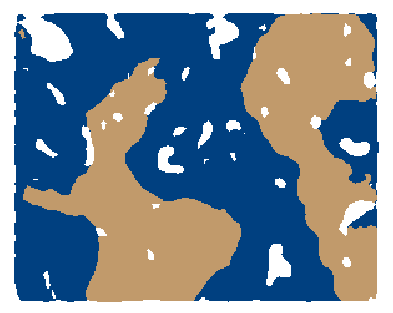

In [ ]:
plt.imshow(create_example(all_test[3][20][0].numpy()))
plt.grid(False)
plt.xticks([])
plt.yticks([])

In [ ]:
all_test[3][20][0].shape

torch.Size([240, 304])

In [ ]:
all_test[3][20][0].shape

torch.Size([240, 304])

([], <a list of 0 Text yticklabel objects>)

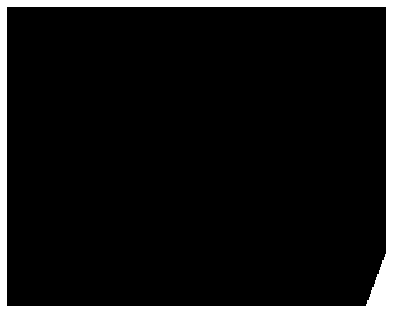

In [ ]:
plt.imshow(create_dilated_tumour_mask(all_test[3][20][0]))
plt.grid(False)
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

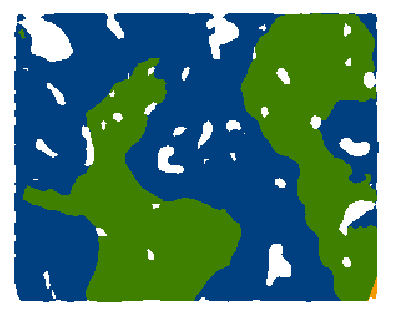

In [ ]:
plt.imshow(create_example(post_processed_test_images[20]))
plt.grid(False)
plt.xticks([])
plt.yticks([])

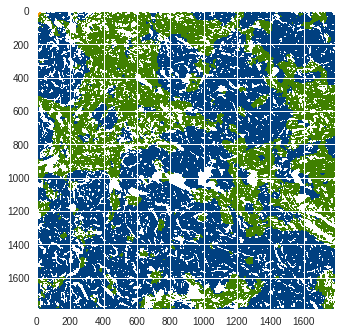

In [ ]:

plt.imshow(create_example(create_post_process_mask(all_test[3][68][0])))

In [ ]:
model = smp.DeepLabV3Plus(
    encoder_name="resnet50",        # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=3,                      # model output channels (number of classes in your dataset)
).to(device)

In [ ]:
model.load_state_dict(torch.load('/content/gdrive/MyDrive/deeplabplus_50_grid_other.pth')['model_state_dict'])


<All keys matched successfully>

In [ ]:
all_test = seg_test (dataloader_segmentation_test, model)

100%|██████████| 70/70 [00:02<00:00, 30.99it/s]


In [ ]:
post_processed_test_images = list()

for pred in all_test[3]:
  post_processed_test_images.append(create_post_process_mask(pred[0]))


In [ ]:
print(calculate_metrics(post_processed_test_images, all_test[2],classMetrics)[0])

{'background': 0.7126111495158474, 'tumour': 0.6503645565263545, 'stroma': 0.4379367317719433, 'normal': 0.3213150908995868}


In [ ]:
print(calculate_metrics(post_processed_test_images, all_test[2],classMetrics)[1])

{'background': 0.8321925846591638, 'tumour': 0.7881465388413641, 'stroma': 0.6124223616713307, 'normal': 0.4925057863571061}


In [ ]:
def create_example(mask):
    mask = mask
    this_mask = np.zeros((mask.shape[0], mask.shape[1],3),dtype=np.uint8)
    for i in range(len(mask)):
      for j in range(len(mask[0])):
        if mask[i][j] == 0:
          this_mask[i][j] = [255,255,255]
        elif mask[i][j] == 1:
          this_mask[i][j] = [0,64,128]
        elif mask[i][j] == 2:
          this_mask[i][j] = [64,128,0]
        elif mask[i][j] == 3:
          this_mask[i][j] = [243,152,0]

        
    return this_mask 

In [ ]:
from tiatoolbox.utils.visualization import overlay_prediction_mask


In [ ]:
label_color_dict ={
    0 : ('Background', np.array([255,255,255])),
    1 : ('Tumour',np.array([0,64,128])),
    2 : ('Stroma',np.array([64,128,0])),
    3 : ('Normal',np.array([243,152,0]))
}

([], <a list of 0 Text yticklabel objects>)

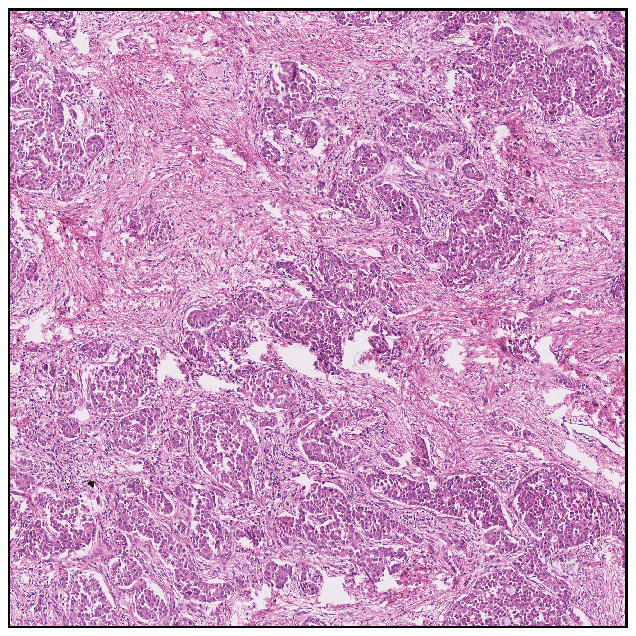

In [ ]:
plt.figure(figsize=(10, 20), dpi=80)

plt.imshow(test_X_data[68])
plt.grid(False)
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

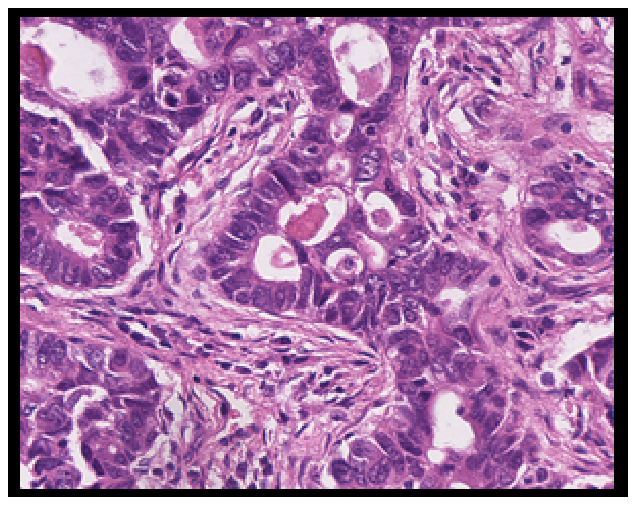

In [ ]:
plt.figure(figsize=(10, 20), dpi=80)

plt.imshow(test_X_data[20])
plt.grid(False)
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

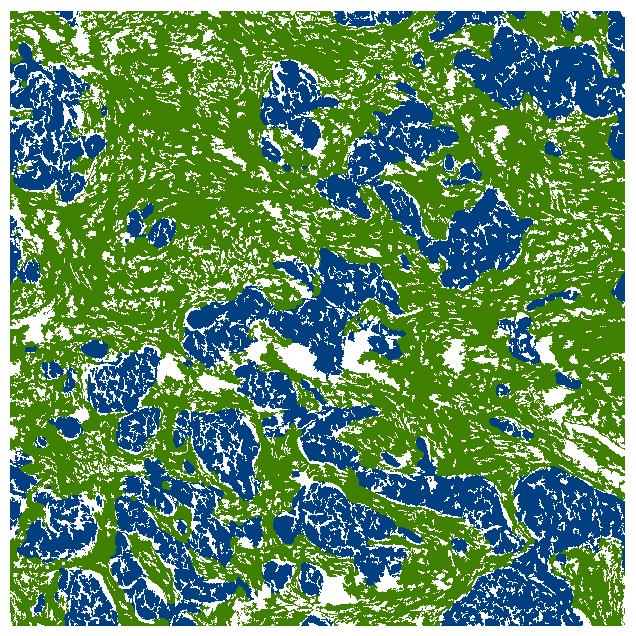

In [ ]:
plt.figure(figsize=(10, 20), dpi=80)
plt.imshow(create_example(all_test[2][68].reshape(1792,1792)))
plt.grid(False)
plt.xticks([])
plt.yticks([])


In [ ]:
overlay = overlay_prediction_mask(
    test_X_data[68], post_processed_test_images[68], alpha=0.5, label_info=label_color_dict, return_ax=False
)

([], <a list of 0 Text yticklabel objects>)

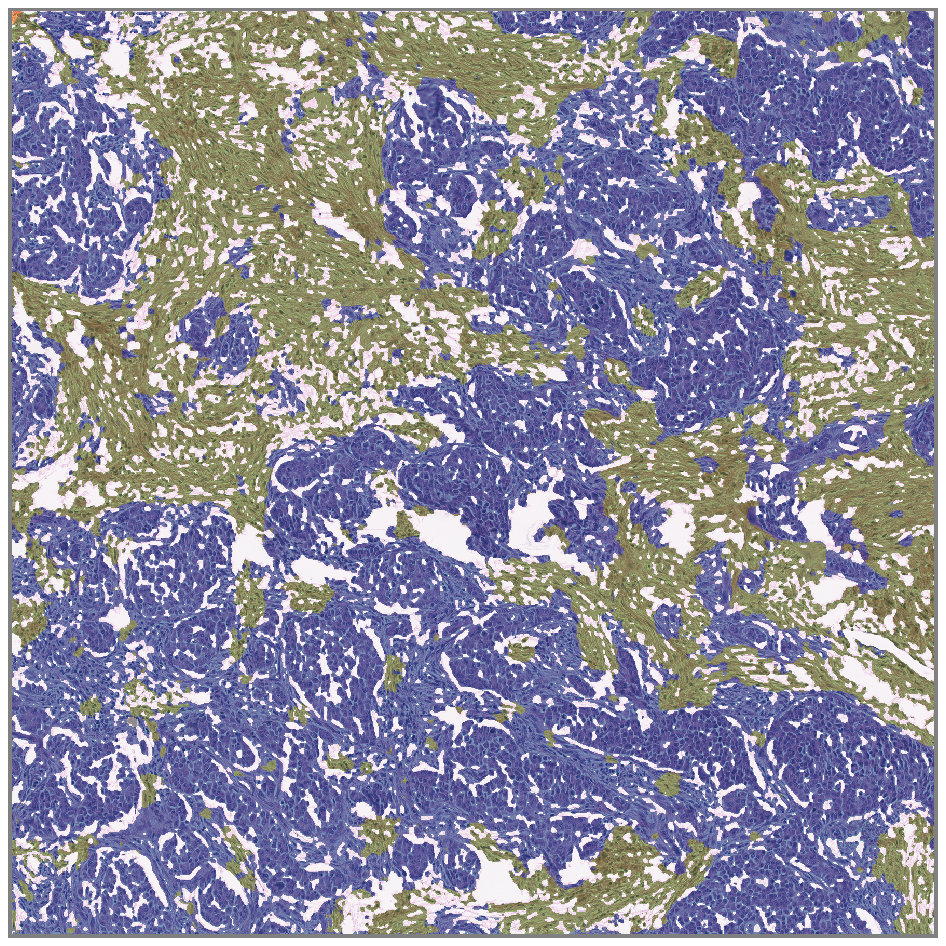

In [ ]:
plt.figure(figsize=(15, 20), dpi=80)
plt.imshow(overlay)
plt.grid(False)
plt.xticks([])
plt.yticks([])

In [ ]:
overlay = overlay_prediction_mask(
    test_X_data[68], post_processed_test_images[68], alpha=0.5, label_info=label_color_dict, return_ax=False
)

([], <a list of 0 Text yticklabel objects>)

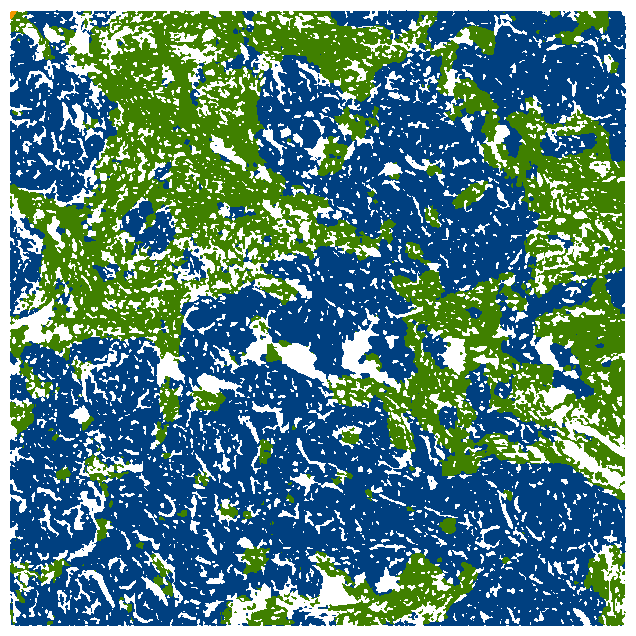

In [ ]:
plt.figure(figsize=(10, 20), dpi=80)
plt.imshow(create_example(post_processed_test_images[68]))
plt.grid(False)
plt.xticks([])
plt.yticks([])


([], <a list of 0 Text yticklabel objects>)

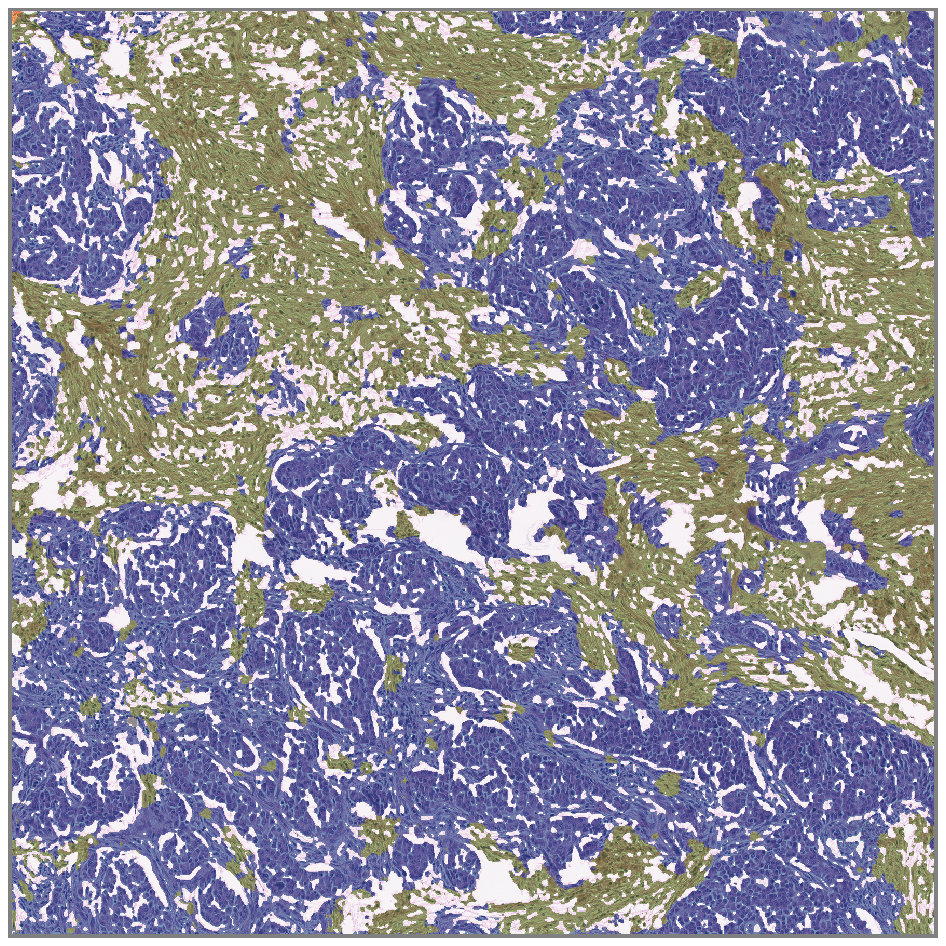

In [ ]:
plt.figure(figsize=(15, 20), dpi=80)
plt.imshow(overlay)
plt.grid(False)
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

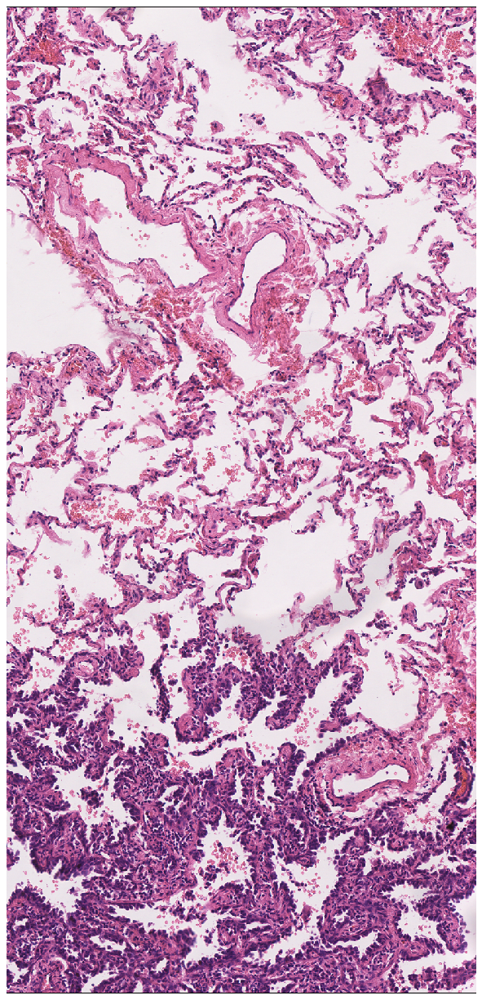

In [ ]:
plt.figure(figsize=(10, 20), dpi=80)

plt.imshow(test_X_data[67])
plt.grid(False)
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

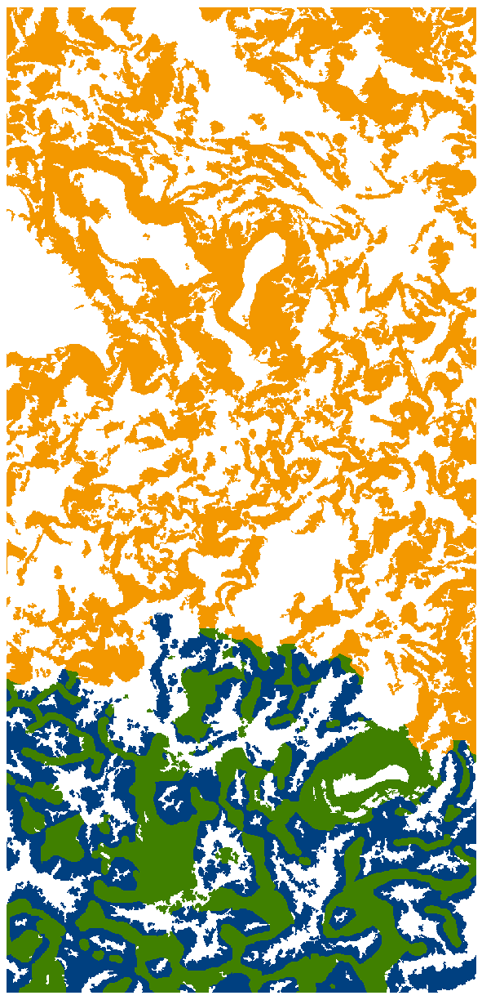

In [ ]:
plt.figure(figsize=(10, 20), dpi=80)

plt.imshow(create_example(all_test[2][67].reshape(1712,816)))
plt.grid(False)
plt.xticks([])
plt.yticks([])

In [ ]:
overlay = overlay_prediction_mask(
    test_X_data[67], all_test[2][67].reshape(1712,816), alpha=0.5, label_info=label_color_dict, return_ax=False
)

([], <a list of 0 Text yticklabel objects>)

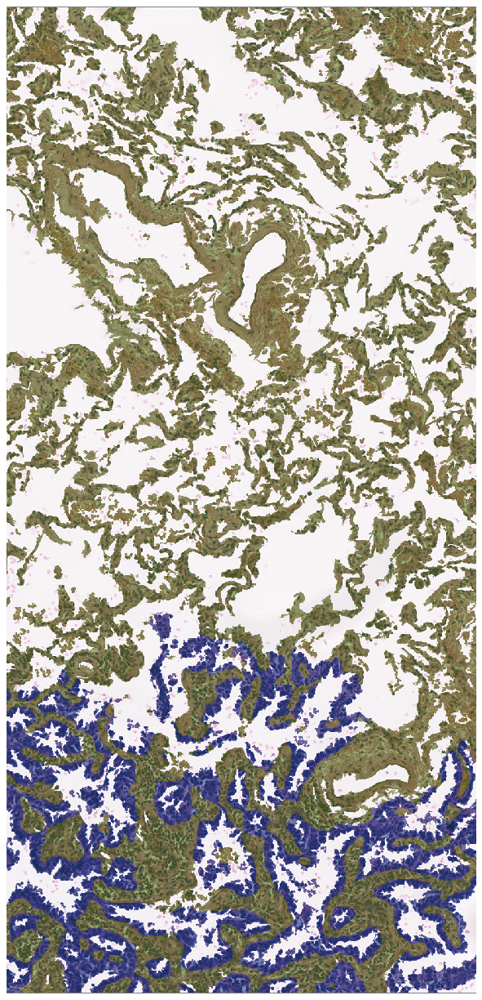

In [ ]:
plt.figure(figsize=(15, 20), dpi=80)
plt.imshow(overlay)
plt.grid(False)
plt.xticks([])
plt.yticks([])

In [ ]:
overlay = overlay_prediction_mask(
    test_X_data[67], post_processed_test_images[67], alpha=0.5, label_info=label_color_dict, return_ax=False
)

([], <a list of 0 Text yticklabel objects>)

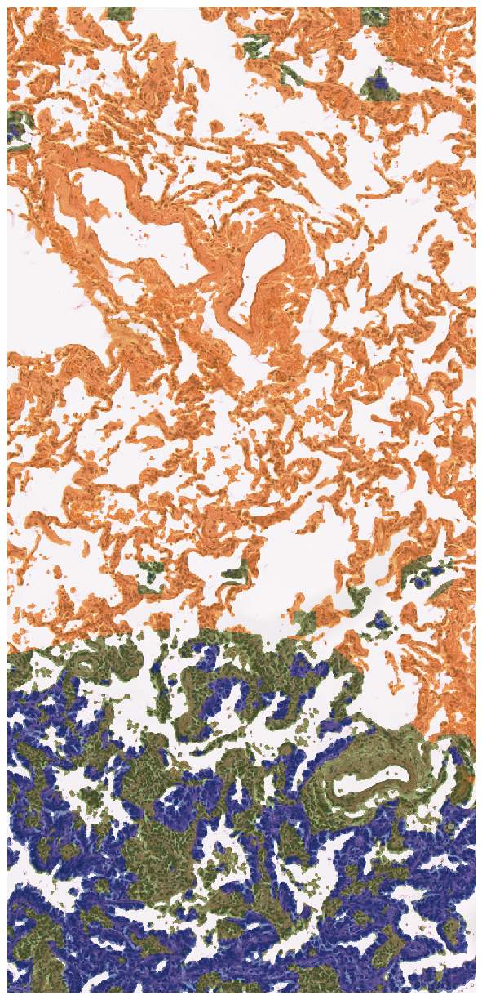

In [ ]:
plt.figure(figsize=(15, 20), dpi=80)
plt.imshow(overlay)
plt.grid(False)
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

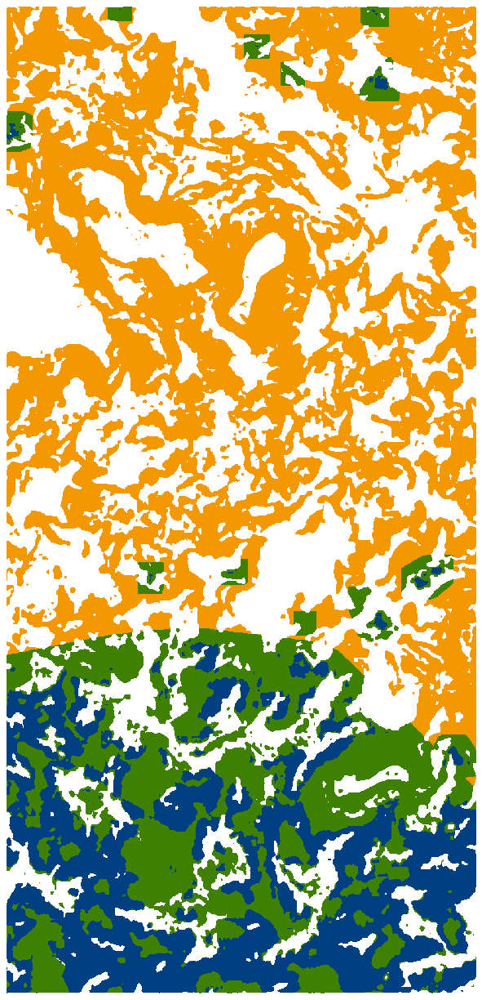

In [ ]:
plt.figure(figsize=(10, 20), dpi=80)

plt.imshow(create_example(post_processed_test_images[67]))
plt.grid(False)
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

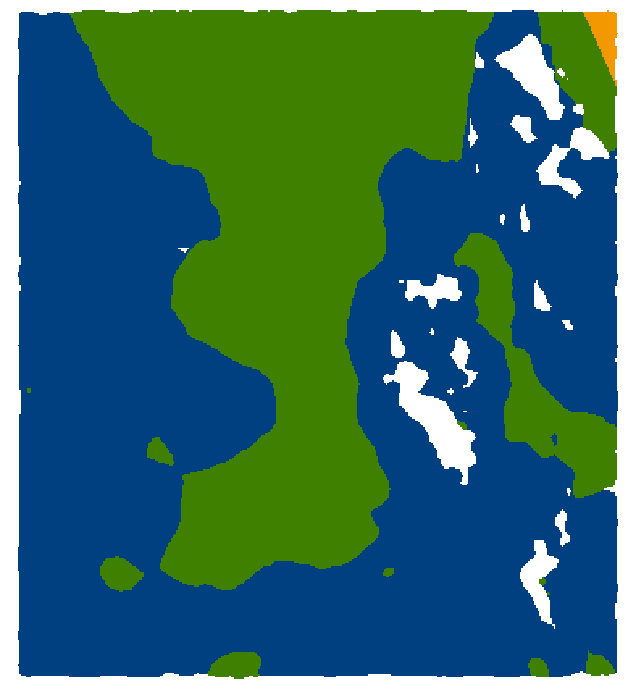

In [ ]:
plt.figure(figsize=(10, 20), dpi=80)

plt.imshow(create_example(post_processed_test_images[65]))
plt.grid(False)
plt.xticks([])
plt.yticks([])

In [ ]:
overlay = overlay_prediction_mask(
    test_X_data[65], post_processed_test_images[65], alpha=0.5, label_info=label_color_dict, return_ax=False
)

([], <a list of 0 Text yticklabel objects>)

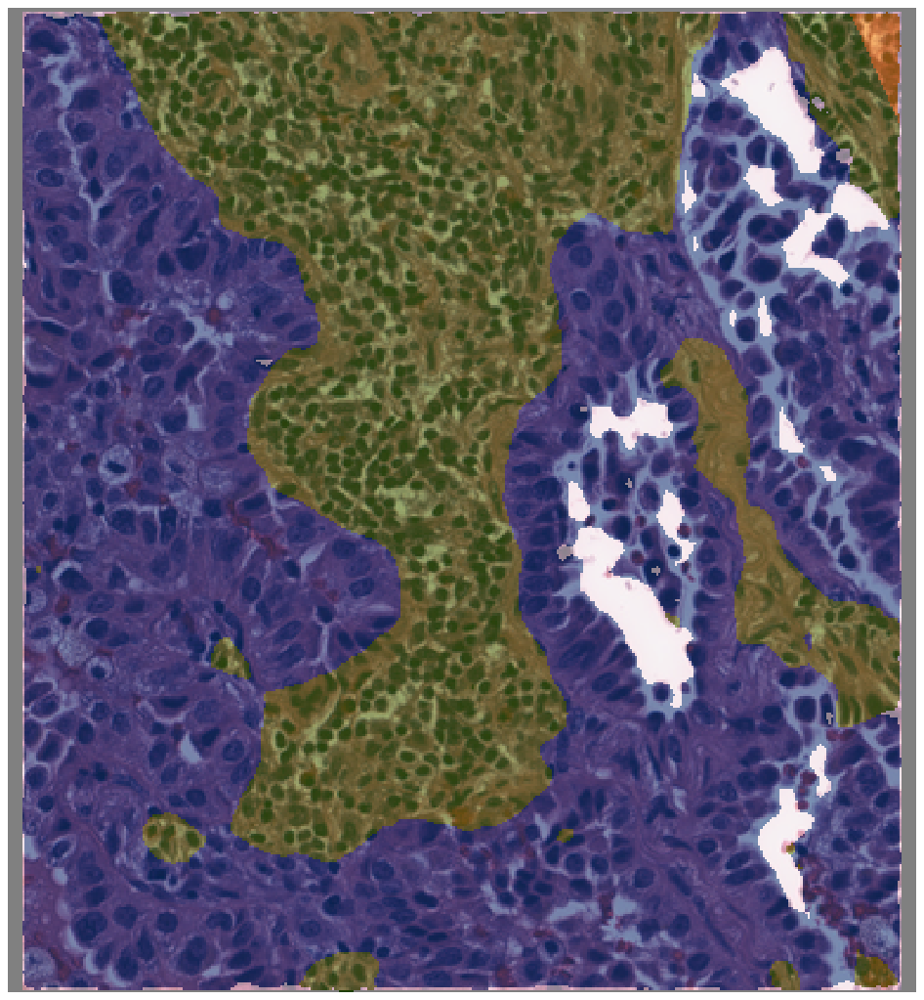

In [ ]:
plt.figure(figsize=(15, 20), dpi=80)
plt.imshow(overlay)
plt.grid(False)
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

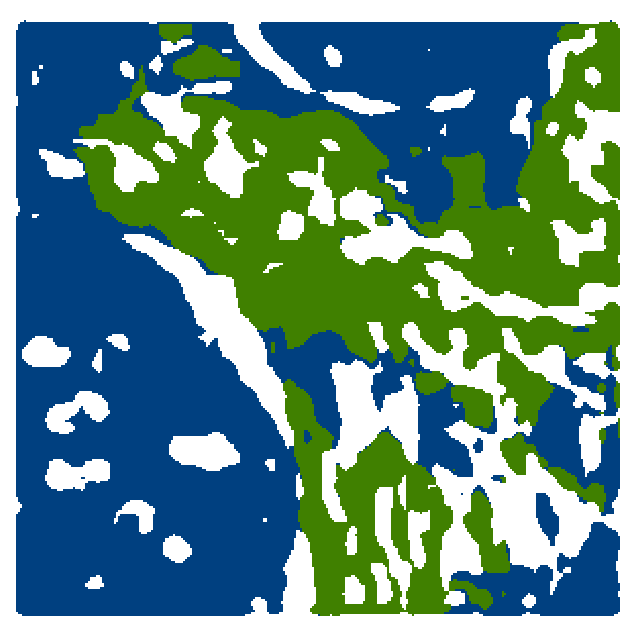

In [ ]:
plt.figure(figsize=(10, 20), dpi=80)
plt.imshow(create_example(post_processed_test_images[6]))
plt.grid(False)
plt.xticks([])
plt.yticks([])

In [ ]:
overlay = overlay_prediction_mask(
    test_X_data[6], post_processed_test_images[6], alpha=0.5, label_info=label_color_dict, return_ax=False
)

([], <a list of 0 Text yticklabel objects>)

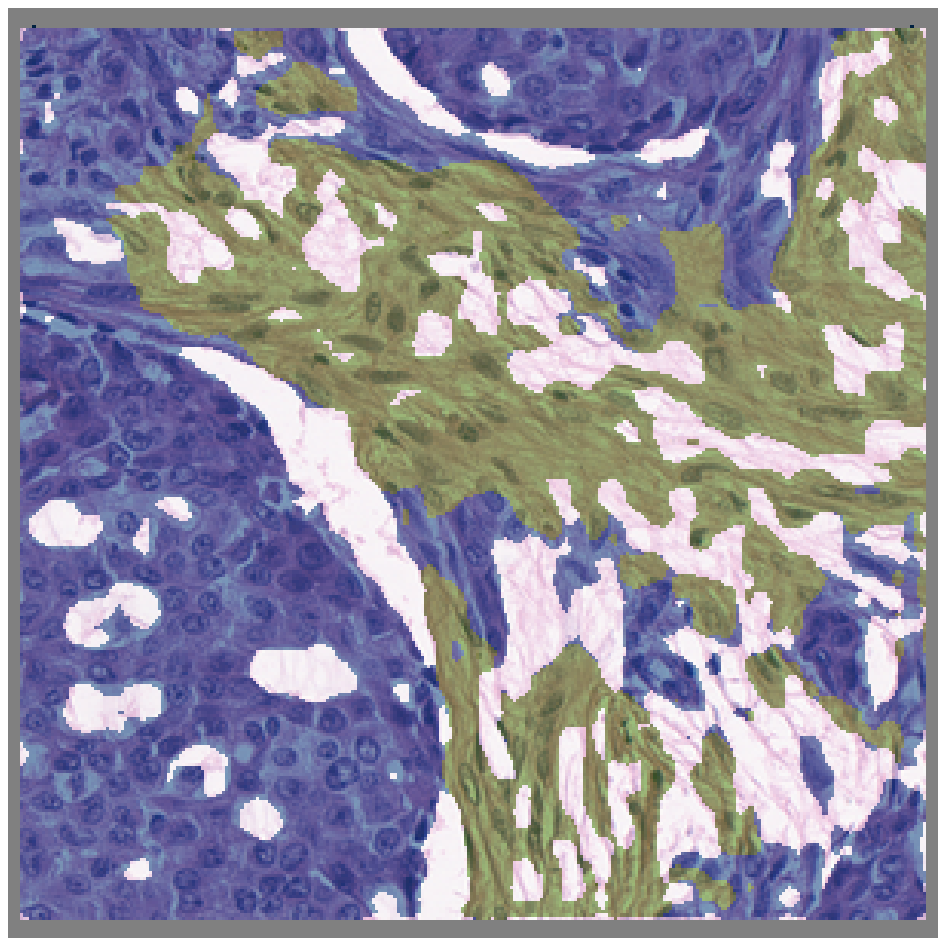

In [ ]:
plt.figure(figsize=(15, 20), dpi=80)
plt.imshow(overlay)
plt.grid(False)
plt.xticks([])
plt.yticks([])